# Aggregate results

Aggregate results from experiments here

* What does mutual information mean in this case?

In [1]:
import pandas as pd
import numpy as np
from evaluation_utils import *

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dfs = []
stats = []

#### Order of info: PATTERN, pt, model, dataset, nk, lvl, mean, var, entropy, mutual info

models = ['bert', 'electra', 'roberta', 'gpt2-medium']
# datasets = [ 'SemEval', 'SST-2', 'hatexplain']
nks = ['token-unk', 'token-mask', 'charswap', 'synonym', 'butterfingers', 'wordswap', 'charinsert', 'l33t']
lvls = ['05', '10', '25', '50', '70', '80', '90', '95'] 
grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']


## Debugging

In [40]:
# NO POSITIVE ANNOTATIONS: ['SST-2', 'random', 'charswap', 'GuidedBP', '95', Index(['attribution_scores', 'perturbation'], dtype='object')]
model = 'electra'
dataset = 'SST-2'
h = 'random'
nk = 'charswap'
k = 'GuidedBP'
lvl = '95'

collect_stats(model, dataset, h, nk, lvl)

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


NO POSITIVE ANNOTATIONS: ['SST-2', 'random', 'charswap', 'GuidedBP', '95', Index(['attribution_scores', 'perturbation'], dtype='object')]
NO POSITIVE ANNOTATIONS: ['SST-2', 'random', 'charswap', 'GuidedBP', '95', Index(['attribution_scores', 'anno'], dtype='object')]
NO POSITIVE ANNOTATIONS: ['SST-2', 'random', 'charswap', 'GuidedBP', '95', Index(['attribution_scores', 'anno'], dtype='object')]


/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/project/noise-paper/evaluation_utils.py:49: RuntimeWarning: invalid value encountered in divide
  a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))

['random',
 None,
 'electra',
 'SST-2',
 'charswap',
 '95',
 0.5873015873015873,
 0.827142857142857,
 0.3680939618571428,
 0.7783031993912207,
 0.015575710969388897,
 0.44421900343625986,
 0.03902441874574993,
 0.01560264350788392,
 -0.003758026259229776,
 0.033693954594056726,
 -0.016889484672980494,
 -0.03981561243867443,
 -0.08939466554738756,
 -0.05907302667268249,
 -0.035379872271852617,
 0.08367805464865051,
 -0.035766389729951345,
 0.05681204793671896,
 0.03833402428241399,
 0.9569284020504264,
 0.9541261494680696,
 0.956303355354689,
 0.9559140033446198,
 0.41243458486604584,
 0.39089759061850526,
 0.408566397254682,
 0.3825351310042545,
 0.27334089723284,
 0.23878498948164534,
 0.23745045924927774,
 0.229617848282066,
 2.3829790513621973,
 2.3908784569356265,
 2.335692432794629,
 2.6913355164142003]

In [50]:
from ast import literal_eval


anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
label_pattern =  pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"label"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="label").map(lambda x: x*2 - 1)
anno_pattern *= label_pattern
anno_pattern.name = 'anno'

perturb_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"{h}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="perturbation")

filename = f"Saliency/Clean/{model}/{h}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
df = pd.read_csv(filename, index_col=0, sep = '\t')
df.head()

og_filename = f"Saliency/Clean/{model}/{dataset}-{k}.tsv"
df_og = pd.read_csv(og_filename, index_col=0, sep = '\t')

df['attribution_scores'] = df['attribution_scores'].map(convert_to_list)
df_og['attribution_scores'] = df_og['attribution_scores'].map(convert_to_list)

perturb_pattern = perturb_pattern.map(lambda x: [int(literal_eval(y)) for y in x.split()])

,text,annotations,label
index,,,
0,<user> men can not be raped can not be abused ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1
1,<user> you are missing an essential premise wh...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1
9,fell outta love and found a boss bitch,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",1
10,a pussy hoe could never is so ghetto and i hat...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1
11,i saw this porno once where the black guy had ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1


In [51]:
df['attribution_scores'].loc[423]

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -0.0,
 0.0,
 0.0,
 -0.0,
 -0.0]

In [38]:
from scipy.stats import pearsonr

pearsonr(df[['attribution_scores']].loc[0].item(), df_og[['attribution_scores']].loc[0].item())

PearsonRResult(statistic=-0.38287314822147533, pvalue=0.19661362773512372)

In [53]:
# og_corrs = df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').dropna().reset_index().apply(lambda x: get_correlation(x.attribution_scores_x, x.attribution_scores_y, temp_fix=True, extra_data=[dataset, h, nk, k,lvl, x.id]), axis=1)

# noise_corrs = df[['attribution_scores']].merge(perturb_pattern, left_index=True, right_index=True, how = 'inner').dropna().reset_index().apply(lambda x: get_correlation(x.attribution_scores, x.perturbation, temp_fix=True, extra_data=[dataset,h, nk, k, lvl, x.id]), axis=1)
noise_corrs = df[['attribution_scores']].merge(perturb_pattern, left_index=True, right_index=True, how = 'inner').dropna().reset_index().apply(lambda x: get_map( x.perturbation, x.attribution_scores, temp_fix=True, extra_data=[dataset,h, nk,k, lvl, x.id]), axis=1)


NO POSITIVE ANNOTATIONS: ['SST-2', 'random', 'charswap', 'GuidedBP', '95', 423]


In [3]:
collect_stats('bert', 'hatexplain', 'gradient', nk='charinsert', lvl=70, temp_fix=True)

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found

['gradient',
 None,
 'bert',
 'hatexplain',
 'charinsert',
 70,
 0.30735551663747807,
 0.8172854640980735,
 0.46288509662259186,
 0.7381721910620341,
 0.029972549591445397,
 0.6056132350449437,
 0.09416514800163753,
 0.01687923645257852,
 0.034953573497670434,
 0.09568836257964054,
 0.2240558255056303,
 0.015663941924546405,
 -0.006950159372361643,
 -0.05053539339368197,
 -0.1412782757571446,
 0.008978554335031664,
 -0.023900133451912588,
 -0.03207450380310382,
 -0.00044601938448555177,
 0.7436275729107502,
 0.7382310964443612,
 0.7232836312245443,
 0.6971400759530746,
 0.2502334505944258,
 0.23823229630857576,
 0.2680612044529664,
 0.2907271185563561,
 0.2502334505944258,
 0.23823229630857576,
 0.2680612044529664,
 0.2907271185563561,
 2.544314372573676,
 2.5828996369766424,
 2.636659257720982,
 2.932185897928195,
 0.04015651656840482,
 0.04515577855320275,
 0.057265910748506954,
 0.1355398299254216]

In [9]:
pd.read_csv("tmp/svm-erda/Saliency/Clea")

SyntaxError: unmatched ')' (1758295817.py, line 1)

In [18]:
test = pd.read_csv("/tmp/svm-erda/Saliency/Clean/gpt2-medium/random/token-unk/95/SemEval/GuidedBP/GuidedBP.tsv", sep="\t", index_col=0, quoting=3)

test.loc[253235076115070976]

pred_class                                                            1
true_class                                                            1
pred_prob                                                          0.62
pred_entropy                                                   0.663948
raw_input             [UNK] [UNK] [UNK] [UNK] [UNK] [UNK] [UNK] [UNK...
attribution_scores    -0.00 -0.00 -0.00 0.00 0.00 0.00 0.00 0.00 0.0...
Name: 253235076115070976, dtype: object

In [83]:
from evaluation_utils import *

high_prec = pd.read_csv("High_Precision_CLEAN.tsv", sep="\t", index_col=0,quoting=3)

In [84]:
high_prec.loc[high_prec[(high_prec["nk"] == "token") & (high_prec["raw_input"].str.contains("\[MASK\]"))].index, "nk"] = "token-mask"
high_prec.loc[high_prec[(high_prec["nk"] == "token") & (high_prec["raw_input"].str.contains("\[UNK\]"))].index, "nk"] = "token-unk"
high_prec = high_prec.reset_index()
high_prec.loc[2084, "nk"] = "token-mask"
high_prec.loc[2086, "nk"] = "token-unk"
high_prec.set_index("id", inplace=True)


In [85]:
high_prec

,pred_class,true_class,pred_prob,pred_entropy,raw_input,attribution_scores,model,data,pattern,pt,nk,lvl,grad,index
id,,,,,,,,,,,,,,
106,0,0,0.86,0.484509,besideJs i sam irish xwhite niggeir Espud nigg...,0.000816 0.001324 0.001087 0.000239 0.001209 0...,bert,hatexplain,gradient,NaN,token-unk,70.0,GuidedBP,106
923,1,2,0.47,1.045175,bQest live tRopic iP lhave seeHn on guab Kchec...,-0.023614 -0.023212 -0.022235 -0.022014 -0.022...,bert,hatexplain,gradient,NaN,charinsert,70.0,GuidedBP,923
1145,1,2,0.69,0.779557,ymou aYre obgviously stPupid Vso your woulod n...,0.030288 0.005642 0.006963 0.007680 0.006371 0...,bert,hatexplain,gradient,NaN,token-unk,70.0,GuidedBP,1145
1242,0,0,0.94,0.254187,whiteG peoplSe whlo havHe enouYgh rDacial sens...,-0.004367 -0.005146 -0.005761 -0.004765 -0.004...,bert,hatexplain,gradient,NaN,token-unk,70.0,GuidedBP,1242
1691,1,2,0.52,0.729957,totalbiscuitM mainvly attacBked sjwAs becSause...,-0.004618 -0.006322 -0.008232 -0.008128 -0.007...,bert,hatexplain,gradient,NaN,charinsert,70.0,GuidedBP,1691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,1,1,0.98,0.109110,filmmakOers whso caen deftly Zchange moods arp...,-0.030413 -0.030810 -0.031694 -0.033867 -0.035...,electra,SST-2,random,NaN,charinsert,90.0,GuidedBP,202
423,0,1,0.78,0.528894,oneD nf phe besf frlms Uf mhe yeaF wiwh itsb e...,0.022330 0.022970 0.024116 0.025053 0.023593 0...,electra,SST-2,random,NaN,charswap,95.0,GuidedBP,423
350,1,0,0.62,0.663743,[UNK] [UNK] [UNK] [UNK] [UNK] [UNK] [UNK] [UNK...,-0.004480 -0.004595 -0.001646 -0.001691 -0.001...,gpt2-medium,SST-2,gradient,NaN,token-unk,80.0,IntegGrad,350


In [81]:
high_prec.nk.unique()

array(['token-unk', 'charinsert', 'charswap', 'butterfingers', 'synonym',
       'wordswap', 'token-mask', 'l33t'], dtype=object)

In [61]:
high_prec[(high_prec["nk"] == "token")].iloc[0]["nk"] = "token-mask"
high_prec[(high_prec["nk"] == "token")].iloc[1]["nk"] = "token-unk"

In [69]:
high_prec.nk.unique()

array(['token-unk', 'charinsert', 'charswap', 'butterfingers', 'synonym',
       'wordswap', 'token-mask', 'l33t', 'token'], dtype=object)

## Uncertainty and Saliency
Currently just gets accuracy and uncertainty data from both file sets. Later will add saliency information

In [3]:
collect_stats('bert', 'SST-2', 'Clean', temp_fix=True)

Missing filename: Saliency/Clean/bert/SST-2-GuidedBP.tsv
continuous format is not supported
Missing filename: Saliency/Clean/bert/SST-2-InputXGrad.tsv
continuous format is not supported
Missing filename: Saliency/Clean/bert/SST-2-IntegGrad.tsv
continuous format is not supported
Missing filename: Saliency/Clean/bert/SST-2-SmoothGrad.tsv
continuous format is not supported


['Clean',
 None,
 'bert',
 'SST-2',
 None,
 None,
 nan,
 nan,
 nan,
 0.9852874624714375,
 0.005472726362780121,
 0.03444722965052707,
 0.015022897853377402,
 1.0,
 nan,
 1.0,
 nan,
 1.0,
 nan,
 1.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 -0.030982664086458386,
 0.02512697589907933,
 0.33792726879171936,
 0.34394434179832994,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan]

In [39]:
PATTERN = 'human'
pt = 'S'
nk = 'token-mask'
lvl='50'
dataset = 'SST-2'
model = 'bert'

In [40]:
if PATTERN == 'Clean':
        filename = f"Uncertainty/{model}/{PATTERN.upper()}/{dataset}_uncertainty.tsv"
elif PATTERN == 'human':
    if pt == 'A':
        filename = f"Uncertainty/{model}/{PATTERN}/{pt}/{nk}/{dataset}_uncertainty.tsv"
    else:
        filename = f"Uncertainty/{model}/{PATTERN}/{pt}/{nk}/{lvl}/{dataset}_uncertainty.tsv"
else: ## All else
    filename = f"Uncertainty/{model}/{PATTERN}/{nk}/{lvl}/{dataset}_uncertainty.tsv"

if dataset == 'hatexplain' or dataset == 'esnli':
    n_classes = 3
else:
    n_classes = 2

try:
    df = pd.read_csv(filename, index_col=0)

    if (dataset == 'hatexplain') and( temp_fix == True): ############ CATCH
        print("REMOVING DATAPOINTS 304,407,932 DUE TO CORRUPTION")
        df.drop(index=[304,407,932], inplace = True)  
        
    certainty_mean = df[[f'mean_{n}' for n in range(n_classes)]].max(axis=1).mean()
    entropy_val = df[['entropy']].max(axis=1).mean()
    mutual_info = df[['mutual_info']].max(axis=1).mean()

    COI = 'variance_'+ df[[f'mean_{n}' for n in range(n_classes)]].idxmax(axis=1).map(lambda x: x[-1]).values

    variances = []
    for i in range(df.shape[0]):
        variances.append(df[COI[i]].iloc[i])
    certainty_variance = np.mean(variances)
    
except (FileNotFoundError, ValueError) as error:
    print("MISSING: ", filename)
    print(error)
    certainty_mean = np.nan
    certainty_variance = np.nan
    entropy_val = np.nan
    mutual_info = np.nan

In [41]:
og_sims = []
noise_sims = []
anno_sims = []
noise_map = []
all_anno_map = []
majo_anno_map = []
complexities = []

if dataset == 'SST-2':                
    anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
else:
    anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x]))
        
label_pattern =  pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"label"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="label").map(lambda x: x*2 - 1)

anno_pattern *= label_pattern
anno_pattern.name = 'anno'

if PATTERN == 'human':
    if pt == 'A':
        perturb_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"{PATTERN}-{pt}_PATTERN"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="perturbation")
    else:
        perturb_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"{PATTERN}-{pt}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="perturbation")
elif PATTERN == 'gradient':
    perturb_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"{PATTERN}-{model}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="perturbation")
elif PATTERN == 'random': # random
    perturb_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"{PATTERN}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="perturbation")

if PATTERN != "Clean":
    perturb_pattern = perturb_pattern.map(lambda x: [int(bool(y)) for y in x.split()])


In [42]:
if dataset == 'hatexplain' and temp_fix: ############ CATCH
    print("REMOVING DATAPOINTS 304,407,932 DUE TO CORRUPTION")
    anno_pattern.drop(index=[304,407,932], inplace = True) 
    label_pattern.drop(index=[304,407,932], inplace = True)
    if PATTERN != "Clean":
        perturb_pattern.drop(index=[304,407,932], inplace = True)  
    
all_annos_pattern= anno_pattern.map(lambda x: np.where(x>0, 1, 0))
majority_annos_pattern = anno_pattern.map(lambda x: np.where(x>0.5, 1, 0))
all_annos_pattern.name = 'anno'
majority_annos_pattern.name = 'anno'

In [43]:
k = 'SmoothGrad'

In [44]:
og_filename = f"Saliency/Clean/{model}/{dataset}-{k}.tsv"
df_og = pd.read_csv(og_filename, index_col=0, sep = '\t')

if PATTERN != 'Clean':
    if PATTERN == 'human':
        if pt == 'A':
            filename = f"Saliency/Clean/{model}/{PATTERN}/{pt}/{nk}/{dataset}/{k}/{k}.tsv"
            df = pd.read_csv(filename, index_col=0, sep = '\t')
        else:
            filename = f"Saliency/Clean/{model}/{PATTERN}/{pt}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
            df = pd.read_csv(filename, index_col=0, sep = '\t')
    else:
        filename = f"Saliency/Clean/{model}/{PATTERN}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
        df = pd.read_csv(filename, index_col=0, sep = '\t')
        
else:
    filename = f"Saliency/Clean/{model}/{dataset}-{k}.tsv"
    df = pd.read_csv(filename, index_col=0, sep = '\t')

accuracy_mean = 1 - (df['true_class'] - df['pred_class']).abs().mean()
pred_prob = df['pred_prob'].mean()
pred_entropy = df['pred_entropy'].mean()

if dataset == 'hatexplain' and temp_fix:
    df.drop(index=[304,407,932], inplace= True)
    df_og.drop(index=[304,407,932], inplace= True)

df['attribution_scores'] = df['attribution_scores'].map(convert_to_list)
df_og['attribution_scores'] = df_og['attribution_scores'].map(convert_to_list)

In [46]:
df['attribution_scores']

id
0      [0.24, 0.35, 0.22, 0.25, 0.27, 0.24, 0.21, 0.1...
20     [0.17, 0.23, 0.19, 0.21, 0.11, 0.21, 0.3, 0.19...
26     [0.32, 0.48, 0.18, 0.15, 0.17, 0.13, 0.12, 0.1...
33     [0.34, 0.14, 0.2, 0.35, 0.16, 0.21, 0.31, 0.21...
71     [0.16, 0.28, 0.17, 0.25, 0.24, 0.25, 0.17, 0.4...
                             ...                        
485    [0.16, 0.27, 0.26, 0.25, 0.23, 0.17, 0.13, 0.1...
489     [0.19, 0.24, 0.19, 0.23, 0.28, 0.38, 0.33, 0.27]
492    [0.24, 0.15, 0.14, 0.19, 0.24, 0.33, 0.16, 0.2...
495    [0.38, 0.13, 0.18, 0.19, 0.2, 0.14, 0.17, 0.19...
498    [0.2, 0.32, 0.25, 0.24, 0.2, 0.14, 0.27, 0.2, ...
Name: attribution_scores, Length: 63, dtype: object

In [47]:
def get_map(new, old, temp_fix=False, extra_data=None):
    
    if not any(old):
        print("NO POSITIVE ANNOTATIONS:", extra_data)
        return np.nan
    
    if temp_fix == True:
        if len(old) > len(new): ## If tokenizer wrong size, do this for now
            print("FIXED: ", extra_data)
            old = old[:len(new)]
        return average_precision_score(new,old,pos_label=1)

In [58]:
## Get correlation to original saliency map
if PATTERN == 'Clean':
    og_sims.append(1.0) # Perfect correlation
else:
    og_corrs = df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores_x, x.attribution_scores_y, temp_fix=True, extra_data=[dataset,PATTERN, nk, k,lvl, x.index]), axis=1)
    og_sims.append(np.mean(og_corrs))
    
if PATTERN == 'Clean':
    ## Get correlation to perturbation map
    noise_sims.append(np.nan) ## No perturbation in Clean data
    noise_map.append(np.nan)
else:
    ## Get correlation to perturbation map
    noise_corrs = df[['attribution_scores']].merge(perturb_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores, x.perturbation, temp_fix=True, extra_data=[dataset,PATTERN, nk, k, lvl, x.index]), axis=1)
    noise_sims.append(np.mean(noise_corrs))
    noise_corrs = df[['attribution_scores']].merge(perturb_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.perturbation, x.attribution_scores, temp_fix=True, extra_data=[dataset,PATTERN, nk,k, lvl, x.index]), axis=1)
    noise_map.append(np.mean(noise_corrs))
    

## Get correlation to humman annotation
anno_corrs = df[['attribution_scores']].merge(anno_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores, x.anno, temp_fix=True, extra_data=[dataset,PATTERN, nk,k, lvl, x.index]), axis=1) #temp_fix=False, extra_data=None):
anno_sims.append(np.mean(anno_corrs))

## Get correlation to humman annotation
all_anno_corrs = df[['attribution_scores']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.attribution_scores, temp_fix=True, extra_data=[dataset,PATTERN, nk,k, lvl, x.index]), axis=1)
all_anno_map.append(np.mean(all_anno_corrs))

majo_anno_corrs = df[['attribution_scores']].merge(majority_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.attribution_scores, temp_fix=True, extra_data=[dataset,PATTERN, nk,k, lvl, x.index]), axis=1)
majo_anno_map.append(np.mean(majo_anno_corrs))

complexity = df['attribution_scores'].map(get_entropy_complexity)
complexities.append(np.mean(complexity))

In [62]:
np.all(np.array([1,1,1,1]) == 1)

True

In [57]:
def get_correlation(new, old, temp_fix=False, extra_data=None):
    
    if np.all(old==1):
        print("IMPOSSIBLE TO ANNOTATE:", extra_data)
        return np.nan
    
    if temp_fix == True:
        if len(old) > len(new): ## If tokenizer wrong size, do this for now
            print("FIXED: ", extra_data)
            old = old[:len(new)]
    try:
        return pearsonr(new, old)[0]
    except ValueError:
        print("Gave 0:", extra_data)
        return np.nan


In [49]:
# import warnings
# warnings.filterwarnings("ignore")
all_anno_map

[0.6371468070428662]

In [ ]:



    for k in grads:
        try:
            
            
            
            
        except (FileNotFoundError, ValueError) as error:
            complexities.append(np.nan)
            majo_anno_map.append(np.nan)
            all_anno_map.append(np.nan)
            noise_map.append(np.nan)
            noise_sims.append(np.nan)
            og_sims.append(np.nan)
            accuracy_mean = np.nan
            pred_prob = np.nan
            pred_entropy = np.nan
            print(f"Missing filename: {filename}")
            print(error)

In [ ]:
# First clean
PATTERN = 'Clean'
                             
for model in models:
    for dataset in ['SST-2']:
        stats.append(collect_stats(model, dataset, PATTERN, temp_fix=True))
                # filename = f"Uncertainty/{model}/CLEAN/{dataset}_uncertainty.tsv"
                
                # df = pd.read_csv(filename, index_col=0)
                
                # certainty_mean = df[['mean_0','mean_1']].max(axis=1).mean()
                # entropy = df[['entropy']].max(axis=1).mean()
                # mutual_info = df[['mutual_info']].max(axis=1).mean()
                
                # COI = 'variance_'+ df[['mean_0','mean_1']].idxmax(axis=1).map(lambda x: x[-1]).values
                # variances = []
                # for i in range(df.shape[0]):
                #     variances.append(df[COI[i]].iloc[i])
                # certainty_variance = np.mean(variances)
                
                # og_sims = []
                # noise_sims = []
                # anno_sims = []
                
                # if dataset == 'SST-2':               
                #     anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
                # else:
                #     anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x]))
                
                # if dataset == 'hatexplain':
                #     print("REMOVING DATAPOINTS 304,407,932 DUE TO CORRUPTION")
                #     anno_pattern.drop(index=[304,407,932], inplace = True)
                #     df.drop(index=[304,407,932])
                # label_pattern =  pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"label"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="label").map(lambda x: x*2 - 1)
                                        
                # anno_pattern *= label_pattern
                # anno_pattern.name = 'anno'
                
                
                # for k in grads:
                #     filename = f"Saliency/Clean/{model}/{dataset}-{k}.tsv"
                #     df = pd.read_csv(filename, index_col=0, sep = '\t')
                    
                #     accuracy_mean = 1 - (df['true_class'] - df['pred_class']).abs().mean()
                #     pred_prob = df['pred_prob'].mean()
                #     pred_entropy = df['pred_entropy'].mean()
                    
                #     df['attribution_scores'] = df['attribution_scores'].map(convert_to_list)
                #     #df_og['attribution_scores'] = df_og['attribution_scores'].map(convert_to_list)
                    
                #     ## Get correlation to original saliency map
                #     #og_corrs = df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores_x, x.attribution_scores_y, temp_fix=True, extra_data=[nk,lvl]), axis=1)
                #     og_sims.append(1.0) # Perfect correlation
                    
                #     ## Get correlation to perturbation map
                #     noise_sims.append(np.nan) ## No perturbation in Clean data
                    
                #     ## Get correlation to humman annotation
                #     anno_corrs = df[['attribution_scores']].merge(anno_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores, x.anno, temp_fix=True, extra_data=['Clean', dataset, model,k]), axis=1)
                #     anno_sims.append(np.mean(anno_corrs))
                    
                # stats.append(['Clean', None, model, dataset, None, 0, accuracy_mean, pred_prob, pred_entropy, certainty_mean, certainty_variance, entropy, mutual_info] + og_sims + noise_sims + anno_sims)
                
                # # filename = f"Saliency/Clean/{model}/{dataset}-{k}.tsv"
                # # df = pd.read_csv(filename, index_col=0, sep = '\t')
                
                # # accuracy_mean = 1 - (df['true_class'] - df['pred_class']).abs().mean()
                # # pred_prob = df['pred_prob'].mean()
                # # pred_entropy = df['pred_entropy'].mean()
                
                # # stats.append(['Clean', None, model, dataset, None, 0, accuracy_mean, pred_prob, pred_entropy, certainty_mean, certainty_variance, entropy, mutual_info])
                


In [9]:
df_output = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'] + [k+"_og_corr" for k in grads] + [k+"_noise_corr" for k in grads] + [k+"_anno_corr" for k in grads] + [k+"_noise_MAP" for k in grads] + [k+"_all_anno_MAP" for k in grads]+ [k+"_majo_anno_MAP" for k in grads] + [k+"_entropy" for k in grads])

In [ ]:

PATTERN = 'random'

for model in models:
    for dataset in [ 'SST-2']:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise
                stats.append(collect_stats(model, dataset, PATTERN, nk=nk, lvl=lvl, temp_fix=True))

In [11]:
df_output = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'] + [k+"_og_corr" for k in grads] + [k+"_noise_corr" for k in grads] + [k+"_anno_corr" for k in grads] + [k+"_noise_MAP" for k in grads] + [k+"_all_anno_MAP" for k in grads]+ [k+"_majo_anno_MAP" for k in grads] + [k+"_entropy" for k in grads])

In [ ]:
PATTERN = 'gradient'

for model in models:
    for dataset in ['SST-2']:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise
                stats.append(collect_stats(model, dataset, PATTERN, nk=nk, lvl=lvl, temp_fix=True))

In [4]:
df_output = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'] + [k+"_og_corr" for k in grads] + [k+"_noise_corr" for k in grads] + [k+"_anno_corr" for k in grads] + [k+"_noise_MAP" for k in grads] + [k+"_all_anno_MAP" for k in grads]+ [k+"_majo_anno_MAP" for k in grads] + [k+"_entropy" for k in grads])

In [9]:
PATTERN = 'human'

for model in models:
    print(model)
    for dataset in ['SST-2']:
        for pt in ['S', 'R', 'A']:
            print(pt)
            if pt == 'A':
                stats.append(collect_stats(model, dataset, PATTERN, nk=nk, lvl=lvl, pt=pt, temp_fix=True))
                continue
            else:
                for nk in nks: # kinds of noise
                    for lvl in lvls: # levels of noise
                        stats.append(collect_stats(model, dataset, PATTERN, nk=nk, lvl=lvl, pt=pt, temp_fix=True))
            print()
    print()

bert
S
MISSING:  Uncertainty/bert/human/S/token-unk/05/SST-2_uncertainty.tsv
[Errno 2] No such file or directory: 'Uncertainty/bert/human/S/token-unk/05/SST-2_uncertainty.tsv'
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'token-unk', '05']
IMPOSSIBLE TO ANNO

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'Smooth

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'Smooth

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'Smooth

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'Smooth

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
Gave 0: ['SST-2', 'human', 'charswap', 'SmoothGrad']
MISSING:  Uncertainty/bert/human/S/synonym/05/SST-2_uncertainty.tsv
[Errno 2] No such file or directory: 'Uncertainty/bert/human/S/synonym/05/SST-2_uncertainty.tsv'
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'synonym', '05']
IMPOSSIBLE TO ANNOTATE: ['SST-2', 'human', 'synonym', '05']
IMPOSSIBLE TO ANNOTATE: ['

KeyboardInterrupt: 

In [4]:
pd.DataFrame(stats)

,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,40
0,human,S,bert,SST-2,token-unk,05,0.841270,0.903651,0.179436,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.309515,2.343889,2.328806,2.647696
1,human,S,bert,SST-2,token-unk,10,0.825397,0.969524,0.078242,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.334388,2.315372,2.319001,2.648085
2,human,S,bert,SST-2,token-unk,25,0.761905,0.977778,0.071235,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.319059,2.359318,2.314637,2.651231
3,human,S,bert,SST-2,token-unk,50,0.650794,0.931905,0.175095,0.832553,...,NaN,NaN,NaN,NaN,NaN,NaN,2.273115,2.340601,2.295491,2.656856
4,human,S,bert,SST-2,token-unk,70,0.555556,0.879841,0.304695,0.727921,...,NaN,NaN,NaN,NaN,NaN,NaN,2.314130,2.312516,2.324948,2.652225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,human,R,gpt2-medium,SST-2,l33t,70,0.492063,0.735714,0.524995,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.156685,2.306907,2.074521,2.573835
512,human,R,gpt2-medium,SST-2,l33t,80,0.571429,0.757619,0.502029,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.190153,2.336176,2.080922,2.565859
513,human,R,gpt2-medium,SST-2,l33t,90,0.523810,0.735079,0.541225,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.199726,2.377145,2.069890,2.561904
514,human,R,gpt2-medium,SST-2,l33t,95,0.492063,0.727937,0.554739,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.222237,2.399759,2.115386,2.562323


In [5]:
df_output = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'] + [k+"_og_corr" for k in grads] + [k+"_noise_corr" for k in grads] + [k+"_anno_corr" for k in grads] + [k+"_noise_MAP" for k in grads] + [k+"_all_anno_MAP" for k in grads]+ [k+"_majo_anno_MAP" for k in grads] + [k+"_entropy" for k in grads])

In [8]:
df_output['InputXGrad_noise_corr']

0     NaN
1     NaN
2     NaN
3     NaN
4     NaN
       ..
511   NaN
512   NaN
513   NaN
514   NaN
515   NaN
Name: InputXGrad_noise_corr, Length: 516, dtype: float64

In [ ]:
# df_output = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'])

# df_output = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'] + [k+"_og_corr" for k in grads] + [k+"_noise_corr" for k in grads] + [k+"_anno_corr" for k in grads])

df_output.to_csv("Results-SST-2.csv")
df_output.head()

,pattern,pattern_type,model,data,perturbation,lvl,accuracy,softmax_prob,softmax_entropy,certainty_mean,certainty_variance,entropy,mutual_info
0,Clean,None,bert,SemEval,None,0,0.919335,0.980443,0.062738,0.961496,0.009372,0.104193,0.027584
1,Clean,None,bert,SST-2,None,0,0.952381,0.995873,0.022737,0.989704,0.001885,0.039972,0.007020
2,Clean,None,electra,SemEval,None,0,0.918719,0.962697,0.126625,0.940092,0.011133,0.177907,0.030596
3,Clean,None,electra,SST-2,None,0,0.952381,0.997937,0.015623,0.993358,0.000984,0.029964,0.003967
4,Clean,None,roberta,SemEval,None,0,0.937808,0.990622,0.040228,0.965338,0.012858,0.094233,0.037262


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
df_output = pd.read_csv("Results.csv", index_col=0)
df_output.head()

,pattern,pattern_type,model,data,perturbation,lvl,accuracy,softmax_prob,softmax_entropy,certainty_mean,certainty_variance,entropy,mutual_info
0,Clean,NaN,bert,SemEval,NaN,0.0,0.919335,0.980443,0.062738,0.961496,0.009372,0.104193,0.027584
1,Clean,NaN,bert,SST-2,NaN,0.0,0.952381,0.995873,0.022737,0.989704,0.001885,0.039972,0.007020
2,Clean,NaN,electra,SemEval,NaN,0.0,0.918719,0.962697,0.126625,0.940092,0.011133,0.177907,0.030596
3,Clean,NaN,electra,SST-2,NaN,0.0,0.952381,0.997937,0.015623,0.993358,0.000984,0.029964,0.003967
4,Clean,NaN,roberta,SemEval,NaN,0.0,0.937808,0.990622,0.040228,0.965338,0.012858,0.094233,0.037262


## Visualizations

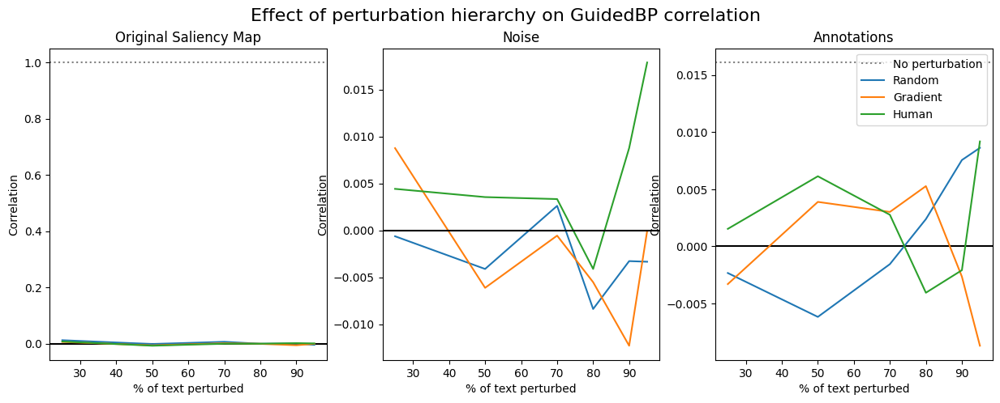

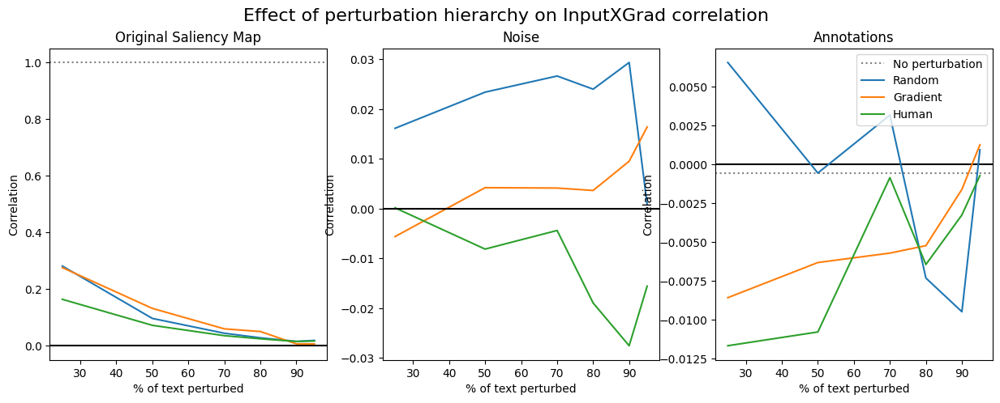

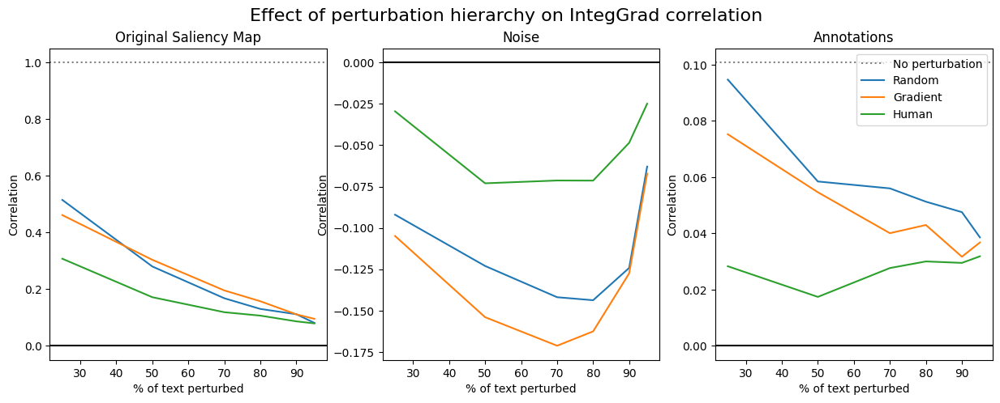

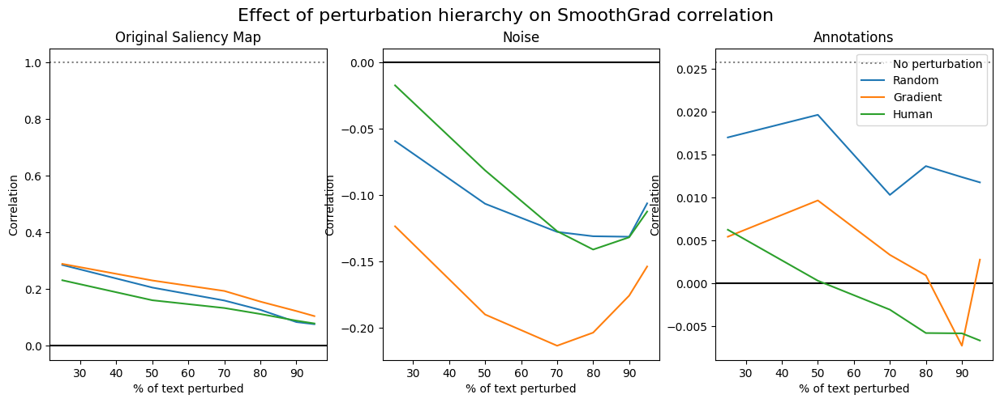

In [12]:
for k in grads:
    pVa = df_output.groupby(['pattern','lvl'])[f'{k}_og_corr'].mean()
    
    fig, ax = plt.subplots(1,3, figsize=(15, 5))
    fig.suptitle(f"Effect of perturbation hierarchy on {k} correlation", size= 16)

    ax[0].set_title("Original Saliency Map")
    ax[0].axhline(pVa['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
    ax[0].axhline(0, color='black')
    ax[0].plot(pVa['random'], label = "Random")
    ax[0].plot(pVa['gradient'], label = "Gradient")
    ax[0].plot(pVa['human'], label = "Human")
    # ax[0].legend()
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Correlation")

    pVc1 = df_output.groupby(['pattern','lvl'])[f'{k}_noise_corr'].mean()

    ax[1].set_title("Noise")
    ax[1].plot(pVc1['random'], label = "Random")
    ax[1].plot(pVc1['gradient'], label = "Gradient")
    ax[1].plot(pVc1['human'], label = "Human")
    ax[1].axhline(0, color='black')
    # ax[1].legend()
    ax[1].set_xlabel("% of text perturbed")
    ax[1].set_ylabel("Correlation")

    pVc2 = df_output.groupby(['pattern','lvl'])[f'{k}_anno_corr'].mean()

    ax[2].set_title("Annotations")
    ax[2].axhline(pVc2['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
    ax[2].axhline(0, color='black')
    ax[2].plot(pVc2['random'], label = "Random")
    ax[2].plot(pVc2['gradient'], label = "Gradient")
    ax[2].plot(pVc2['human'], label = "Human")
    ax[2].legend()
    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("Correlation")

    plt.savefig(f"Figures/HierarchyvsCorr-{k}.png")

In [36]:
df_output[df_output['pattern_type']=='A']['accuracy'].mean()

0.791356908445516

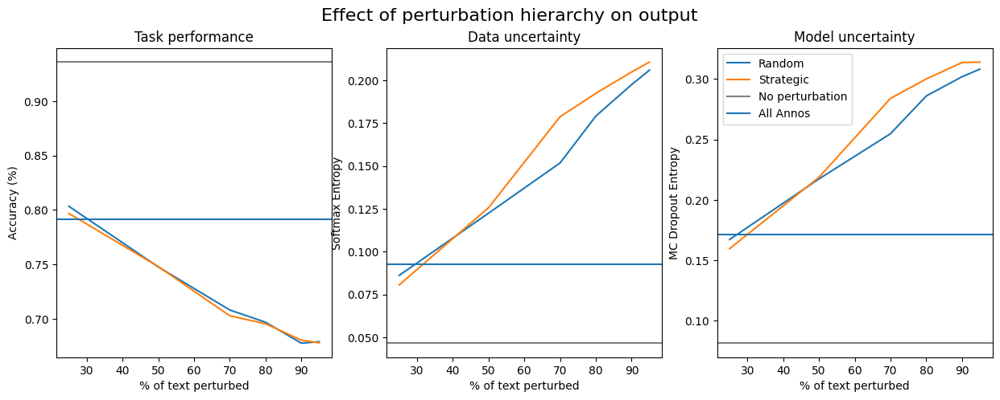

In [38]:
fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation hierarchy on output", size= 16)

pVa = df_output.groupby(['pattern_type','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")
ax[0].plot(pVa['R'], label = "Random")
ax[0].plot(pVa['S'], label = "Strategic")
ax[0].axhline(df_output[df_output['pattern']=='Clean']['accuracy'].mean(), color='grey', label = "No perturbation")
ax[0].axhline(df_output[df_output['pattern_type']=='A']['accuracy'].mean(), label = "All Annos")
# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['pattern_type','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")
ax[1].plot(pVc1['R'], label = "Random")
ax[1].plot(pVc1['S'], label = "Strategic")
ax[1].axhline(df_output[df_output['pattern']=='Clean']['softmax_entropy'].mean(), color='grey', label = "No perturbation")
ax[1].axhline(df_output[df_output['pattern_type']=='A']['softmax_entropy'].mean(), label = "All Annos")
# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['pattern_type','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")
ax[2].plot(pVc2['R'], label = "Random")
ax[2].plot(pVc2['S'], label = "Strategic")
ax[2].axhline(df_output[df_output['pattern']=='Clean']['entropy'].mean(), color='grey', label = "No perturbation")
ax[2].axhline(df_output[df_output['pattern_type']=='A']['entropy'].mean(), label = "All Annos")
ax[2].legend()
ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")


#plt.show()
plt.savefig("Figures/PatternvsOutput.png")

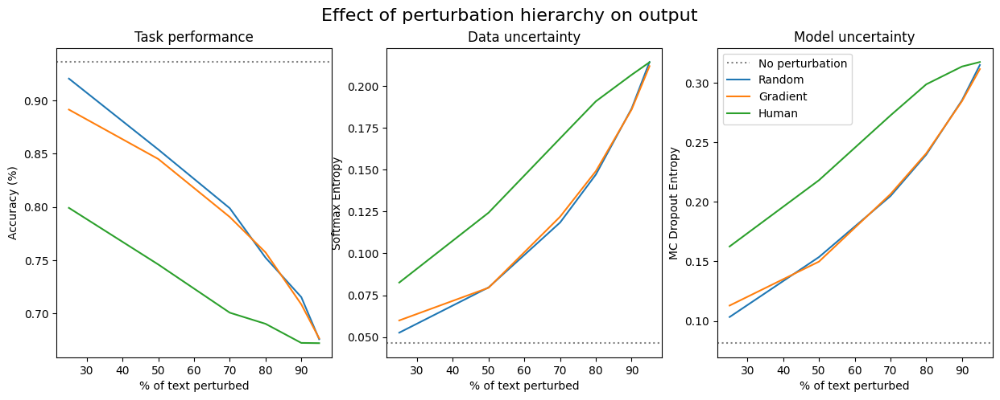

In [5]:
fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation hierarchy on output", size= 16)

pVa = df_output.groupby(['pattern','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")
ax[0].axhline(pVa['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
ax[0].plot(pVa['random'], label = "Random")
ax[0].plot(pVa['gradient'], label = "Gradient")
ax[0].plot(pVa['human'], label = "Human")
# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['pattern','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")
ax[1].axhline(pVc1['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
ax[1].plot(pVc1['random'], label = "Random")
ax[1].plot(pVc1['gradient'], label = "Gradient")
ax[1].plot(pVc1['human'], label = "Human")
# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['pattern','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")
ax[2].axhline(pVc2['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
ax[2].plot(pVc2['random'], label = "Random")
ax[2].plot(pVc2['gradient'], label = "Gradient")
ax[2].plot(pVc2['human'], label = "Human")
ax[2].legend()
ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")


# plt.show()
plt.savefig("Figures/HierarchyvsOutput.png")

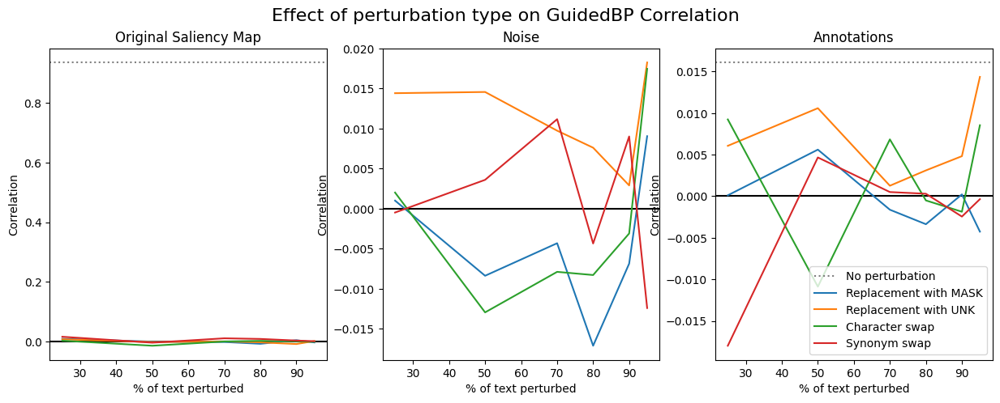

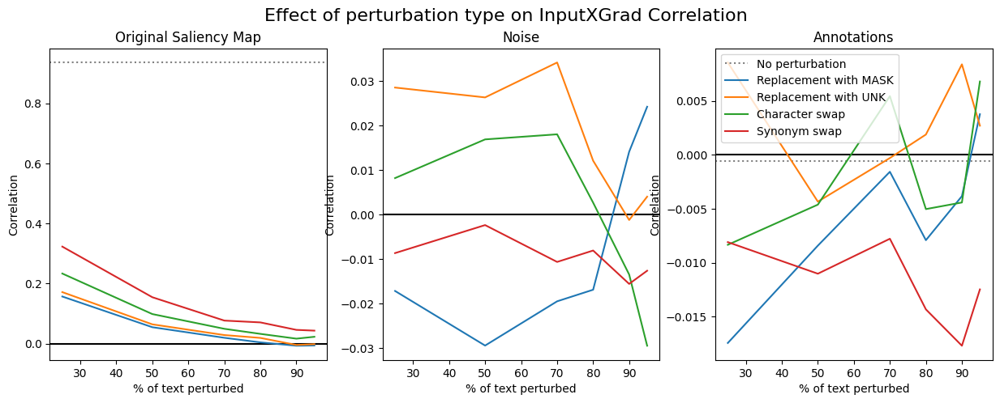

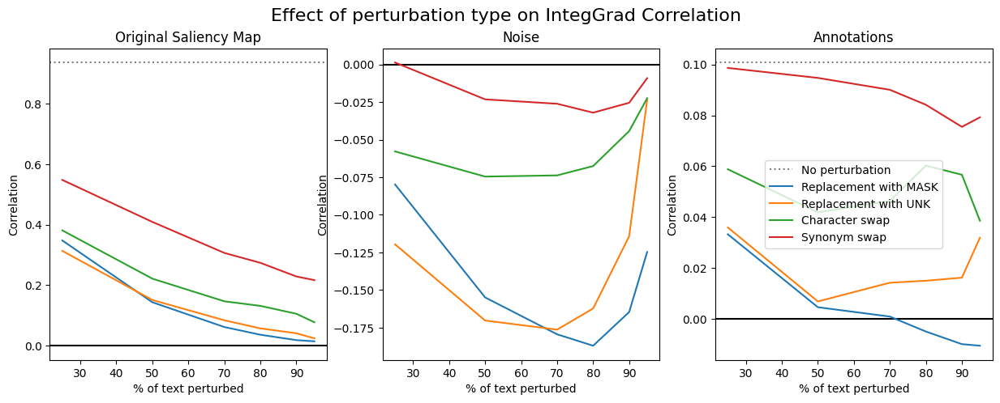

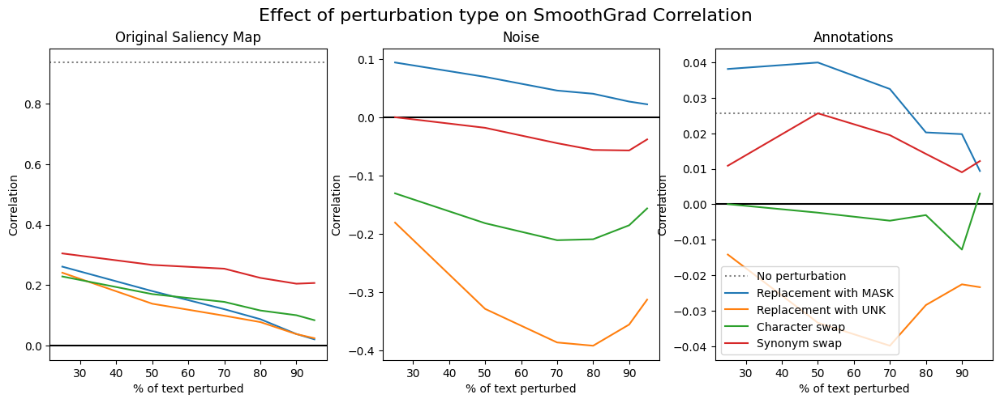

In [13]:
for k in grads:
    pVa = df_output.groupby(['perturbation','lvl'])[f'{k}_og_corr'].mean()
    
    fig, ax = plt.subplots(1,3, figsize=(15, 5))
    fig.suptitle(f"Effect of perturbation type on {k} Correlation", size= 16)

    ax[0].set_title("Original Saliency Map")
    ax[0].axhline(df_output[df_output['pattern'] == 'Clean']['accuracy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    ax[0].axhline(0, color='black')
    ax[0].plot(pVa['token-mask'], label = "Replacement with MASK")
    ax[0].plot(pVa['token-unk'], label = "Replacement with UNK")
    ax[0].plot(pVa['charswap'], label = "Character swap")
    ax[0].plot(pVa['synonym'], label = "Word swap")
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Correlation")

    pVc1 = df_output.groupby(['perturbation','lvl'])[f'{k}_noise_corr'].mean()
    ax[1].set_title("Noise")
    ax[1].axhline(0, color='black')
    ax[1].axhline(df_output[df_output['pattern'] == 'Clean'][f'{k}_noise_corr'].mean(), label = "No perturbation", color='grey', linestyle=':')
    ax[1].plot(pVc1['token-mask'], label = "Replacement with MASK")
    ax[1].plot(pVc1['token-unk'], label = "Replacement with UNK")
    ax[1].plot(pVc1['charswap'], label = "Character swap")
    ax[1].plot(pVc1['synonym'], label = "Word swap")
    ax[1].set_xlabel("% of text perturbed")
    ax[1].set_ylabel("Correlation")

    pVc2 = df_output.groupby(['perturbation','lvl'])[f'{k}_anno_corr'].mean()

    ax[2].set_title("Annotations")
    ax[2].axhline(0, color='black')
    ax[2].axhline(df_output[df_output['pattern'] == 'Clean'][f'{k}_anno_corr'].mean(), label = "No perturbation", color='grey', linestyle=':')
    ax[2].plot(pVc2['token-mask'], label = "Replacement with MASK")
    ax[2].plot(pVc2['token-unk'], label = "Replacement with UNK")
    ax[2].plot(pVc2['charswap'], label = "Character swap")
    ax[2].plot(pVc2['synonym'], label = "Synonym swap")
    ax[2].legend()
    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("Correlation")

    # plt.show()
    plt.savefig(f"Figures/TypevsCorr-{k}.png")
 

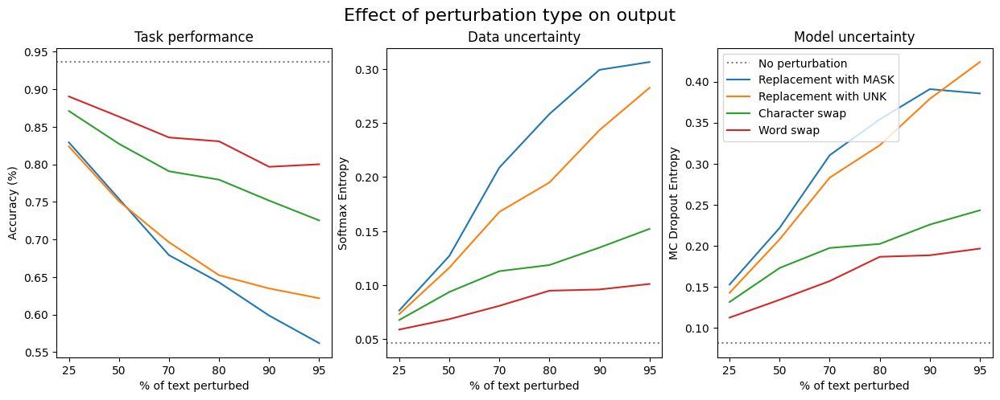

In [183]:
fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation type on output", size= 16)

pVa = df_output.groupby(['perturbation','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")
ax[0].axhline(df_output[df_output['pattern'] == 'Clean']['accuracy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[0].plot(pVa['token-mask'], label = "Replacement with MASK")
ax[0].plot(pVa['token-unk'], label = "Replacement with UNK")
ax[0].plot(pVa['charswap'], label = "Character swap")
ax[0].plot(pVa['synonym'], label = "Word swap")
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
ax[1].set_title("Data uncertainty")
ax[1].axhline(df_output[df_output['pattern'] == 'Clean']['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[1].plot(pVc1['token-mask'], label = "Replacement with MASK")
ax[1].plot(pVc1['token-unk'], label = "Replacement with UNK")
ax[1].plot(pVc1['charswap'], label = "Character swap")
ax[1].plot(pVc1['synonym'], label = "Word swap")
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['perturbation','lvl'])['entropy'].mean()

ax[2].set_title("Model uncertainty")
ax[2].axhline(df_output[df_output['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[2].plot(pVc2['token-mask'], label = "Replacement with MASK")
ax[2].plot(pVc2['token-unk'], label = "Replacement with UNK")
ax[2].plot(pVc2['charswap'], label = "Character swap")
ax[2].plot(pVc2['synonym'], label = "Word swap")
ax[2].legend()
ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")

# plt.show()
plt.savefig("Figures/TypevsOutput.png")

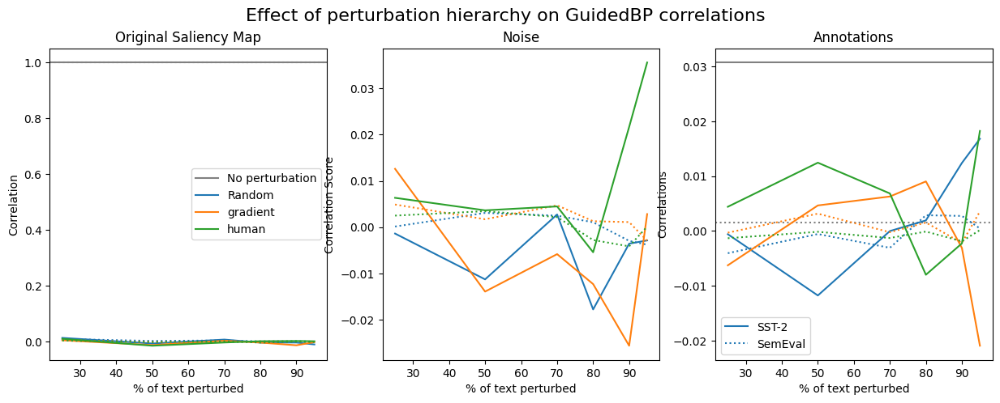

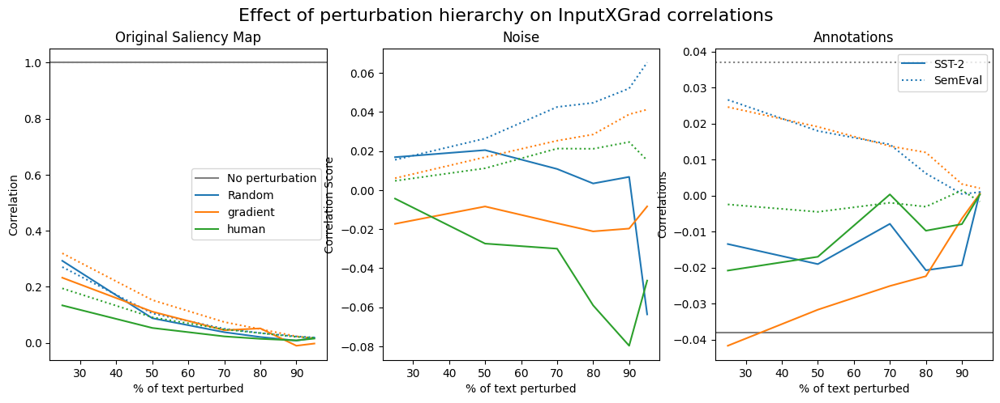

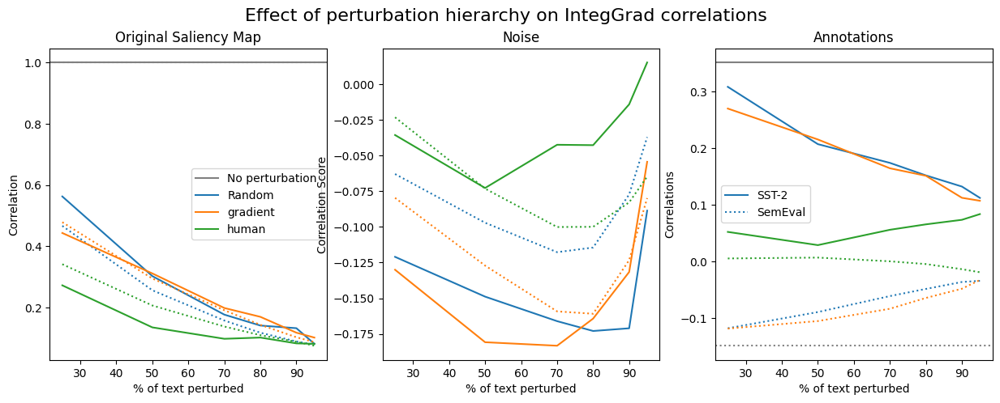

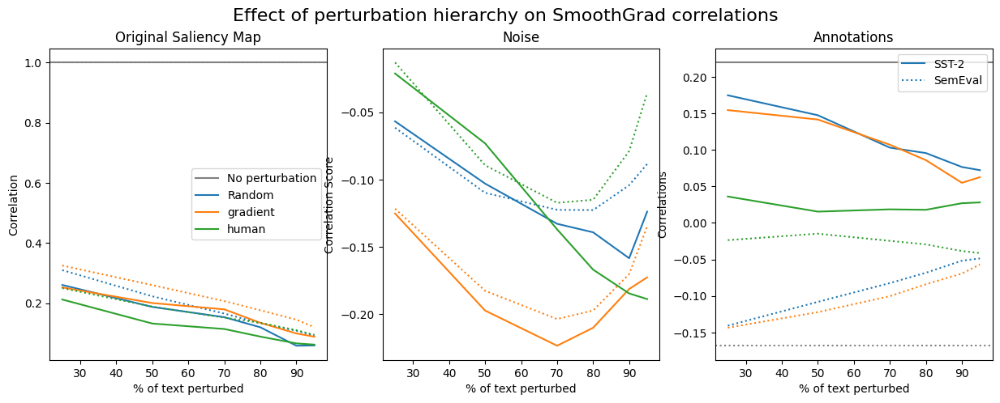

In [17]:
from matplotlib.lines import Line2D

for k in grads:
    pVa = df_output.groupby(['pattern','data','lvl'])[f'{k}_og_corr'].mean()
    
    fig, ax = plt.subplots(1,3, figsize=(15, 5))
    fig.suptitle(f"Effect of perturbation hierarchy on {k} correlations", size= 16)

    ax[0].set_title("Original Saliency Map")

    ax[0].axhline(pVa['Clean']['SST-2'][0], label = "No perturbation", color='grey', linestyle='-')
    ax[0].axhline(pVa['Clean']['SemEval'][0],  color='grey', linestyle=':')


    ax[0].plot(pVa['random']['SST-2'], label = "Random", color='C0', linestyle='-')
    ax[0].plot(pVa['random']['SemEval'],  color='C0', linestyle=':')

    ax[0].plot(pVa['gradient']['SST-2'], label = "gradient", color='C1', linestyle='-')
    ax[0].plot(pVa['gradient']['SemEval'],  color='C1', linestyle=':')

    ax[0].plot(pVa['human']['SST-2'], label = "human", color='C2', linestyle='-')
    ax[0].plot(pVa['human']['SemEval'],  color='C2', linestyle=':')

    ax[0].legend()
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Correlation")

    pVc1 = df_output.groupby(['pattern','data','lvl'])[f'{k}_noise_corr'].mean()

    ax[1].set_title("Noise")

    ax[1].axhline(pVc1['Clean']['SST-2'][0], label = "No perturbation", color='grey', linestyle='-')
    ax[1].axhline(pVc1['Clean']['SemEval'][0], label = "No perturbation", color='grey', linestyle=':')


    ax[1].plot(pVc1['random']['SST-2'], label = "Random", color='C0', linestyle='-')
    ax[1].plot(pVc1['random']['SemEval'], label = "Random", color='C0', linestyle=':')

    ax[1].plot(pVc1['gradient']['SST-2'], label = "gradient", color='C1', linestyle='-')
    ax[1].plot(pVc1['gradient']['SemEval'], label = "gradient", color='C1', linestyle=':')

    ax[1].plot(pVc1['human']['SST-2'], label = "human", color='C2', linestyle='-')
    ax[1].plot(pVc1['human']['SemEval'], label = "human", color='C2', linestyle=':')

    # ax[1].legend()
    ax[1].set_xlabel("% of text perturbed")
    ax[1].set_ylabel("Correlation Score")

    pVc2 = df_output.groupby(['pattern','data','lvl'])[f'{k}_anno_corr'].mean()


    ax[2].set_title("Annotations")

    ax[2].axhline(pVc2['Clean']['SST-2'][0], label = "No perturbation", color='grey', linestyle='-')
    ax[2].axhline(pVc2['Clean']['SemEval'][0], label = "No perturbation", color='grey', linestyle=':')


    ax[2].plot(pVc2['random']['SST-2'], label = "Random", color='C0', linestyle='-')
    ax[2].plot(pVc2['random']['SemEval'], label = "Random", color='C0', linestyle=':')

    ax[2].plot(pVc2['gradient']['SST-2'], label = "gradient", color='C1', linestyle='-')
    ax[2].plot(pVc2['gradient']['SemEval'], label = "gradient", color='C1', linestyle=':')

    ax[2].plot(pVc2['human']['SST-2'], label = "human", color='C2', linestyle='-')
    ax[2].plot(pVc2['human']['SemEval'], label = "human", color='C2', linestyle=':')



    ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='SST-2'),
                Line2D([0], [0], linestyle=':', label='SemEval')])

    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("Correlations")

    plt.savefig(f"Figures/HierarchyvsCorr-{k}_DATA.png")
    #plt.show()

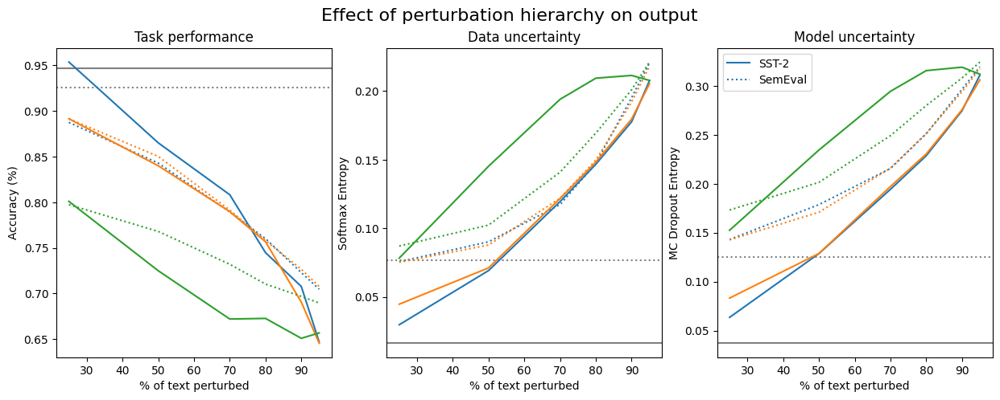

In [10]:
from matplotlib.lines import Line2D

fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation hierarchy on output", size= 16)

pVa = df_output.groupby(['pattern','data','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")

ax[0].axhline(pVa['Clean']['SST-2'][0], label = "No perturbation", color='grey', linestyle='-')
ax[0].axhline(pVa['Clean']['SemEval'][0], label = "No perturbation", color='grey', linestyle=':')


ax[0].plot(pVa['random']['SST-2'], label = "Random", color='C0', linestyle='-')
ax[0].plot(pVa['random']['SemEval'], label = "Random", color='C0', linestyle=':')

ax[0].plot(pVa['gradient']['SST-2'], label = "gradient", color='C1', linestyle='-')
ax[0].plot(pVa['gradient']['SemEval'], label = "gradient", color='C1', linestyle=':')

ax[0].plot(pVa['human']['SST-2'], label = "human", color='C2', linestyle='-')
ax[0].plot(pVa['human']['SemEval'], label = "human", color='C2', linestyle=':')

# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['pattern','data','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")

ax[1].axhline(pVc1['Clean']['SST-2'][0], label = "No perturbation", color='grey', linestyle='-')
ax[1].axhline(pVc1['Clean']['SemEval'][0], label = "No perturbation", color='grey', linestyle=':')


ax[1].plot(pVc1['random']['SST-2'], label = "Random", color='C0', linestyle='-')
ax[1].plot(pVc1['random']['SemEval'], label = "Random", color='C0', linestyle=':')

ax[1].plot(pVc1['gradient']['SST-2'], label = "gradient", color='C1', linestyle='-')
ax[1].plot(pVc1['gradient']['SemEval'], label = "gradient", color='C1', linestyle=':')

ax[1].plot(pVc1['human']['SST-2'], label = "human", color='C2', linestyle='-')
ax[1].plot(pVc1['human']['SemEval'], label = "human", color='C2', linestyle=':')

# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['pattern','data','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")

ax[2].axhline(pVc2['Clean']['SST-2'][0], label = "No perturbation", color='grey', linestyle='-')
ax[2].axhline(pVc2['Clean']['SemEval'][0], label = "No perturbation", color='grey', linestyle=':')


ax[2].plot(pVc2['random']['SST-2'], label = "Random", color='C0', linestyle='-')
ax[2].plot(pVc2['random']['SemEval'], label = "Random", color='C0', linestyle=':')

ax[2].plot(pVc2['gradient']['SST-2'], label = "gradient", color='C1', linestyle='-')
ax[2].plot(pVc2['gradient']['SemEval'], label = "gradient", color='C1', linestyle=':')

ax[2].plot(pVc2['human']['SST-2'], label = "human", color='C2', linestyle='-')
ax[2].plot(pVc2['human']['SemEval'], label = "human", color='C2', linestyle=':')



ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='SST-2'),
              Line2D([0], [0], linestyle=':', label='SemEval')])

ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")

plt.savefig("Figures/HierarchyvsOutput_DATA.png")
#plt.show()

In [ ]:
out_table = df_output.groupby(['perturbation','model','lvl'])[['accuracy', 'softmax_entropy', 'entropy']].mean() - df_output[df_output['pattern']=='Clean'].groupby(['model'])[['accuracy', 'softmax_entropy', 'entropy']].mean()
# out_table = out_table.drop('Clean')

pd.pivot_table(out_table, values= 'accuracy', index=['perturbation','lvl'], columns=['model'])

# df_output.groupby(['pattern','model','lvl'])[['accuracy', 'softmax_entropy', 'entropy']].mean() - df_output[df_output['pattern']=='Clean'].groupby(['model'])[['accuracy', 'softmax_entropy', 'entropy']].mean()

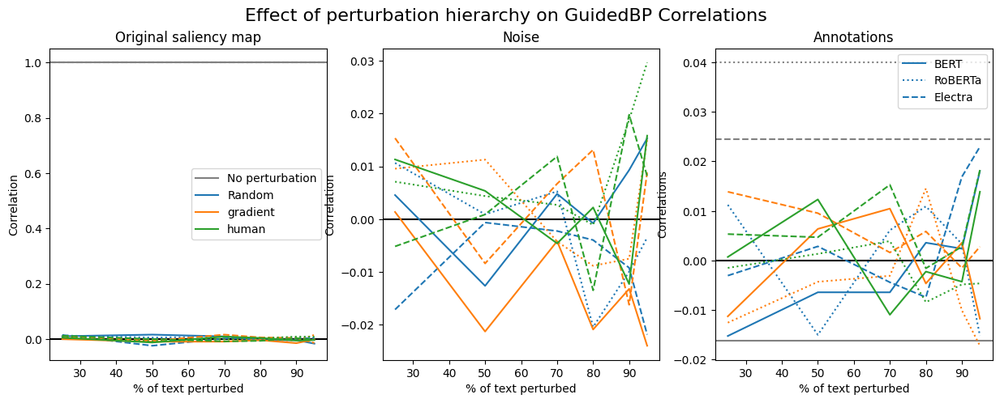

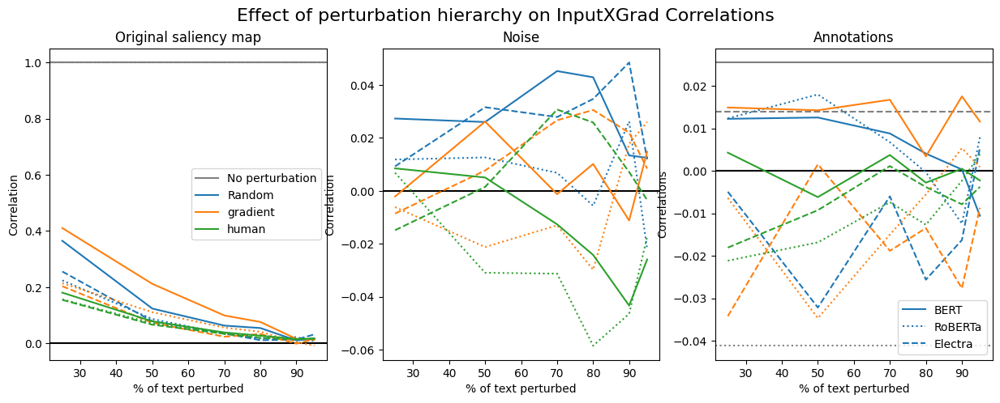

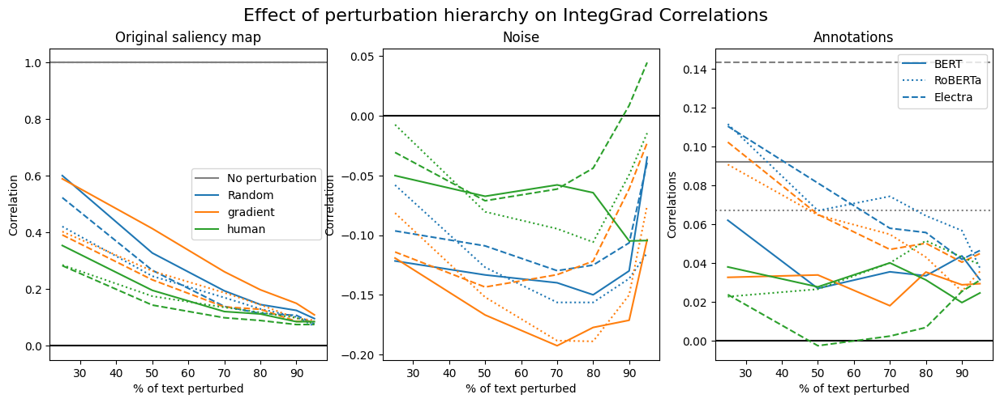

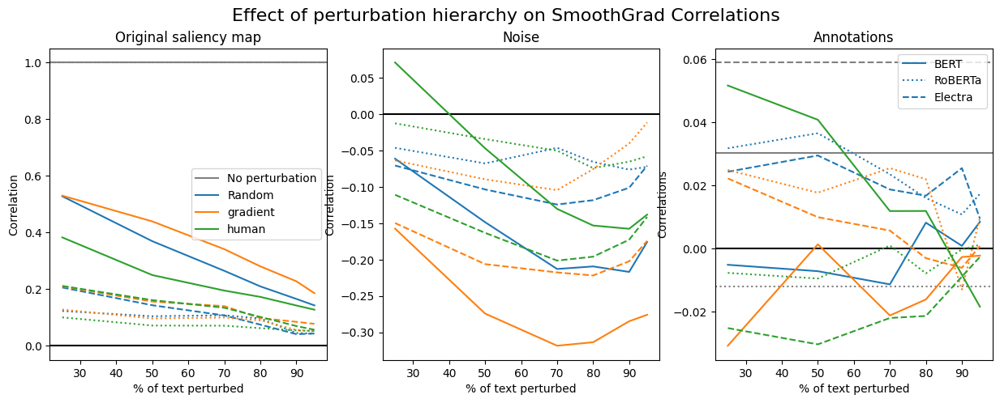

In [19]:
from matplotlib.lines import Line2D

for k in grads:
    fig, ax = plt.subplots(1,3, figsize=(15, 5))
    fig.suptitle(f"Effect of perturbation hierarchy on {k} Correlations", size= 16)

    pVa = df_output.groupby(['pattern','model','lvl'])[f'{k}_og_corr'].mean()


    ax[0].set_title("Original saliency map")

    ax[0].axhline(pVa['Clean']['bert'][0], label = "No perturbation", color='grey', linestyle='-')
    ax[0].axhline(pVa['Clean']['roberta'][0],  color='grey', linestyle=':')
    ax[0].axhline(pVa['Clean']['electra'][0],  color='grey', linestyle='--')
    ax[0].axhline(0, color='black')

    ax[0].plot(pVa['random']['bert'], label = "Random", color='C0', linestyle='-')
    ax[0].plot(pVa['random']['roberta'],  color='C0', linestyle=':')
    ax[0].plot(pVa['random']['electra'],  color='C0', linestyle='--')

    ax[0].plot(pVa['gradient']['bert'], label = "gradient", color='C1', linestyle='-')
    ax[0].plot(pVa['gradient']['roberta'],  color='C1', linestyle=':')
    ax[0].plot(pVa['gradient']['electra'],  color='C1', linestyle='--')

    ax[0].plot(pVa['human']['bert'], label = "human", color='C2', linestyle='-')
    ax[0].plot(pVa['human']['roberta'],  color='C2', linestyle=':')
    ax[0].plot(pVa['human']['electra'],  color='C2', linestyle='--')

    ax[0].legend()
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Correlation")

    pVc1 = df_output.groupby(['pattern','model','lvl'])[f'{k}_noise_corr'].mean()

    ax[1].set_title("Noise")

    ax[1].axhline(pVc1['Clean']['bert'][0], label = "No perturbation", color='grey', linestyle='-')
    ax[1].axhline(pVc1['Clean']['roberta'][0], label = "No perturbation", color='grey', linestyle=':')
    ax[1].axhline(pVc1['Clean']['electra'][0], label = "No perturbation", color='grey', linestyle='--')
    ax[1].axhline(0, color='black')

    ax[1].plot(pVc1['random']['bert'], label = "Random", color='C0', linestyle='-')
    ax[1].plot(pVc1['random']['roberta'], label = "Random", color='C0', linestyle=':')
    ax[1].plot(pVc1['random']['electra'], label = "Random", color='C0', linestyle='--')

    ax[1].plot(pVc1['gradient']['bert'], label = "gradient", color='C1', linestyle='-')
    ax[1].plot(pVc1['gradient']['roberta'], label = "gradient", color='C1', linestyle=':')
    ax[1].plot(pVc1['gradient']['electra'], label = "gradient", color='C1', linestyle='--')

    ax[1].plot(pVc1['human']['bert'], label = "human", color='C2', linestyle='-')
    ax[1].plot(pVc1['human']['roberta'], label = "human", color='C2', linestyle=':')
    ax[1].plot(pVc1['human']['electra'], label = "human", color='C2', linestyle='--')

    # ax[1].legend()
    ax[1].set_xlabel("% of text perturbed")
    ax[1].set_ylabel("Correlation")

    pVc2 = df_output.groupby(['pattern','model','lvl'])[f'{k}_anno_corr'].mean()


    ax[2].set_title("Annotations")

    ax[2].axhline(pVc2['Clean']['bert'][0], label = "No perturbation", color='grey', linestyle='-')
    ax[2].axhline(pVc2['Clean']['roberta'][0], label = "No perturbation", color='grey', linestyle=':')
    ax[2].axhline(pVc2['Clean']['electra'][0], label = "No perturbation", color='grey', linestyle='--')
    ax[2].axhline(0, color='black')


    ax[2].plot(pVc2['random']['bert'], label = "Random", color='C0', linestyle='-')
    ax[2].plot(pVc2['random']['roberta'], label = "Random", color='C0', linestyle=':')
    ax[2].plot(pVc2['random']['electra'], label = "Random", color='C0', linestyle='--')

    ax[2].plot(pVc2['gradient']['bert'], label = "gradient", color='C1', linestyle='-')
    ax[2].plot(pVc2['gradient']['roberta'], label = "gradient", color='C1', linestyle=':')
    ax[2].plot(pVc2['gradient']['electra'], label = "gradient", color='C1', linestyle='--')

    ax[2].plot(pVc2['human']['bert'], label = "human", color='C2', linestyle='-')
    ax[2].plot(pVc2['human']['roberta'], label = "human", color='C2', linestyle=':')
    ax[2].plot(pVc2['human']['electra'], label = "human", color='C2', linestyle='--')



    ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='BERT'),
                Line2D([0], [0], linestyle=':', label='RoBERTa'),
                Line2D([0], [0], linestyle='--', label='Electra')])

    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("Correlations")

    plt.savefig(f"Figures/HierarchyvsCorr-{k}_MODELS.png")
    # plt.show()

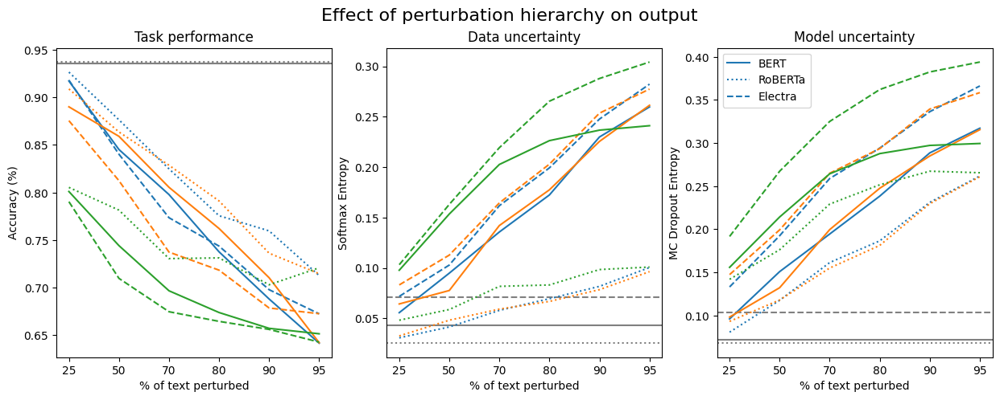

In [146]:
from matplotlib.lines import Line2D

fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation hierarchy on output", size= 16)

pVa = df_output.groupby(['pattern','model','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")

ax[0].axhline(pVa['Clean']['bert'][0], label = "No perturbation", color='grey', linestyle='-')
ax[0].axhline(pVa['Clean']['roberta'][0], label = "No perturbation", color='grey', linestyle=':')
ax[0].axhline(pVa['Clean']['electra'][0], label = "No perturbation", color='grey', linestyle='--')


ax[0].plot(pVa['random']['bert'], label = "Random", color='C0', linestyle='-')
ax[0].plot(pVa['random']['roberta'], label = "Random", color='C0', linestyle=':')
ax[0].plot(pVa['random']['electra'], label = "Random", color='C0', linestyle='--')

ax[0].plot(pVa['gradient']['bert'], label = "gradient", color='C1', linestyle='-')
ax[0].plot(pVa['gradient']['roberta'], label = "gradient", color='C1', linestyle=':')
ax[0].plot(pVa['gradient']['electra'], label = "gradient", color='C1', linestyle='--')

ax[0].plot(pVa['human']['bert'], label = "human", color='C2', linestyle='-')
ax[0].plot(pVa['human']['roberta'], label = "human", color='C2', linestyle=':')
ax[0].plot(pVa['human']['electra'], label = "human", color='C2', linestyle='--')

# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['pattern','model','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")

ax[1].axhline(pVc1['Clean']['bert'][0], label = "No perturbation", color='grey', linestyle='-')
ax[1].axhline(pVc1['Clean']['roberta'][0], label = "No perturbation", color='grey', linestyle=':')
ax[1].axhline(pVc1['Clean']['electra'][0], label = "No perturbation", color='grey', linestyle='--')


ax[1].plot(pVc1['random']['bert'], label = "Random", color='C0', linestyle='-')
ax[1].plot(pVc1['random']['roberta'], label = "Random", color='C0', linestyle=':')
ax[1].plot(pVc1['random']['electra'], label = "Random", color='C0', linestyle='--')

ax[1].plot(pVc1['gradient']['bert'], label = "gradient", color='C1', linestyle='-')
ax[1].plot(pVc1['gradient']['roberta'], label = "gradient", color='C1', linestyle=':')
ax[1].plot(pVc1['gradient']['electra'], label = "gradient", color='C1', linestyle='--')

ax[1].plot(pVc1['human']['bert'], label = "human", color='C2', linestyle='-')
ax[1].plot(pVc1['human']['roberta'], label = "human", color='C2', linestyle=':')
ax[1].plot(pVc1['human']['electra'], label = "human", color='C2', linestyle='--')

# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['pattern','model','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")

ax[2].axhline(pVc2['Clean']['bert'][0], label = "No perturbation", color='grey', linestyle='-')
ax[2].axhline(pVc2['Clean']['roberta'][0], label = "No perturbation", color='grey', linestyle=':')
ax[2].axhline(pVc2['Clean']['electra'][0], label = "No perturbation", color='grey', linestyle='--')


ax[2].plot(pVc2['random']['bert'], label = "Random", color='C0', linestyle='-')
ax[2].plot(pVc2['random']['roberta'], label = "Random", color='C0', linestyle=':')
ax[2].plot(pVc2['random']['electra'], label = "Random", color='C0', linestyle='--')

ax[2].plot(pVc2['gradient']['bert'], label = "gradient", color='C1', linestyle='-')
ax[2].plot(pVc2['gradient']['roberta'], label = "gradient", color='C1', linestyle=':')
ax[2].plot(pVc2['gradient']['electra'], label = "gradient", color='C1', linestyle='--')

ax[2].plot(pVc2['human']['bert'], label = "human", color='C2', linestyle='-')
ax[2].plot(pVc2['human']['roberta'], label = "human", color='C2', linestyle=':')
ax[2].plot(pVc2['human']['electra'], label = "human", color='C2', linestyle='--')



ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='BERT'),
              Line2D([0], [0], linestyle=':', label='RoBERTa'),
              Line2D([0], [0], linestyle='--', label='Electra')])

ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")

plt.savefig("Figures/HierarchyvsOutput_MODELS.png")
# plt.show()

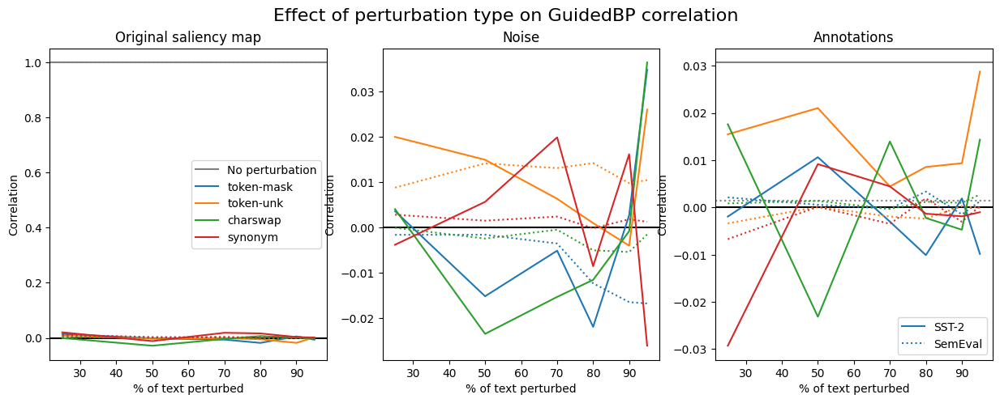

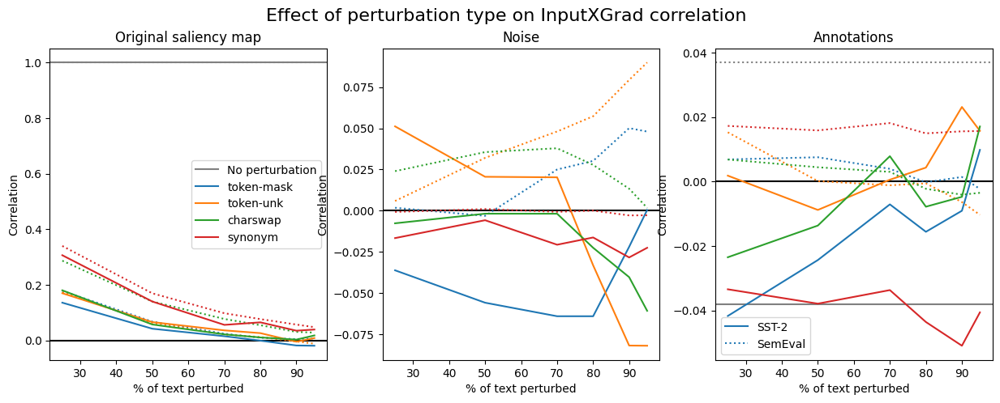

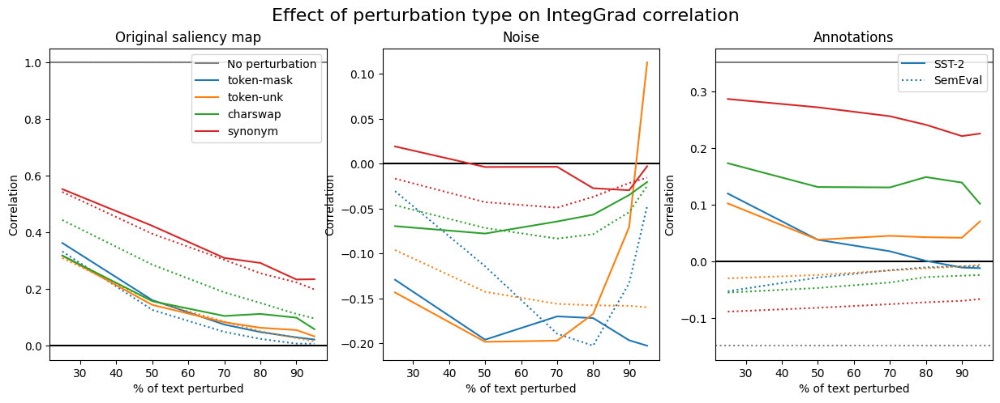

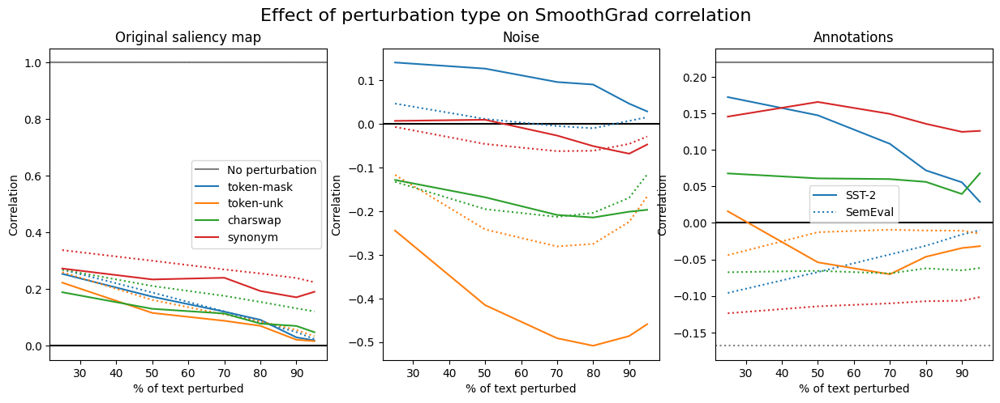

In [24]:
from matplotlib.lines import Line2D

for k in grads:

    fig, ax = plt.subplots(1,3, figsize=(15, 5))
    fig.suptitle(f"Effect of perturbation type on {k} correlation", size= 16)

    pVa = df_output.groupby(['perturbation','data','lvl'])[f'{k}_og_corr'].mean()


    ax[0].set_title("Original saliency map")

    ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SST-2')][f'{k}_og_corr'].mean(), label = "No perturbation", color='grey', linestyle='-')
    ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SemEval')][f'{k}_og_corr'].mean(),  color='grey', linestyle=':')
    ax[0].axhline(0,color='black')

    ax[0].plot(pVa['token-mask']['SST-2'], label = "token-mask", color='C0', linestyle='-')
    ax[0].plot(pVa['token-mask']['SemEval'],  color='C0', linestyle=':')


    ax[0].plot(pVa['token-unk']['SST-2'], label = "token-unk", color='C1', linestyle='-')
    ax[0].plot(pVa['token-unk']['SemEval'],  color='C1', linestyle=':')

    ax[0].plot(pVa['charswap']['SST-2'], label = "charswap", color='C2', linestyle='-')
    ax[0].plot(pVa['charswap']['SemEval'],  color='C2', linestyle=':')

    ax[0].plot(pVa['synonym']['SST-2'], label = "synonym", color='C3', linestyle='-')
    ax[0].plot(pVa['synonym']['SemEval'],  color='C3', linestyle=':')

    ax[0].legend()
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Correlation")

    pVc1 = df_output.groupby(['perturbation','data','lvl'])[f'{k}_noise_corr'].mean()

    ax[1].set_title("Noise")


    ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SST-2')][f'{k}_noise_corr'].mean(), label = "No perturbation", color='grey', linestyle='-')
    ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SemEval')][f'{k}_noise_corr'].mean(), label = "No perturbation", color='grey', linestyle=':')
    ax[1].axhline(0, color='black')

    ax[1].plot(pVc1['token-mask']['SST-2'], label = "token-mask", color='C0', linestyle='-')
    ax[1].plot(pVc1['token-mask']['SemEval'], label = "token-mask", color='C0', linestyle=':')


    ax[1].plot(pVc1['token-unk']['SST-2'], label = "token-unk", color='C1', linestyle='-')
    ax[1].plot(pVc1['token-unk']['SemEval'], label = "token-unk", color='C1', linestyle=':')

    ax[1].plot(pVc1['charswap']['SST-2'], label = "charswap", color='C2', linestyle='-')
    ax[1].plot(pVc1['charswap']['SemEval'], label = "charswap", color='C2', linestyle=':')

    ax[1].plot(pVc1['synonym']['SST-2'], label = "synonym", color='C3', linestyle='-')
    ax[1].plot(pVc1['synonym']['SemEval'], label = "synonym", color='C3', linestyle=':')

    # ax[1].legend()
    ax[1].set_xlabel("% of text perturbed")
    ax[1].set_ylabel("Correlation")

    pVc2 = df_output.groupby(['perturbation','data','lvl'])[f'{k}_anno_corr'].mean()


    ax[2].set_title("Annotations")

    ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SST-2')][f'{k}_anno_corr'].mean(), label = "No perturbation", color='grey', linestyle='-')
    ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SemEval')][f'{k}_anno_corr'].mean(), label = "No perturbation", color='grey', linestyle=':')
    ax[2].axhline(0, color='black')

    ax[2].plot(pVc2['token-mask']['SST-2'], label = "token-mask", color='C0', linestyle='-')
    ax[2].plot(pVc2['token-mask']['SemEval'], label = "token-mask", color='C0', linestyle=':')


    ax[2].plot(pVc2['token-unk']['SST-2'], label = "token-unk", color='C1', linestyle='-')
    ax[2].plot(pVc2['token-unk']['SemEval'], label = "token-unk", color='C1', linestyle=':')

    ax[2].plot(pVc2['charswap']['SST-2'], label = "charswap", color='C2', linestyle='-')
    ax[2].plot(pVc2['charswap']['SemEval'], label = "charswap", color='C2', linestyle=':')

    ax[2].plot(pVc2['synonym']['SST-2'], label = "synonym", color='C3', linestyle='-')
    ax[2].plot(pVc2['synonym']['SemEval'], label = "synonym", color='C3', linestyle=':')


    ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='SST-2'),
                Line2D([0], [0], linestyle=':', label='SemEval')])

    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("Correlation")

    plt.savefig(f"Figures/TypevsCorr-{k}_DATA.png")
    #plt.show()

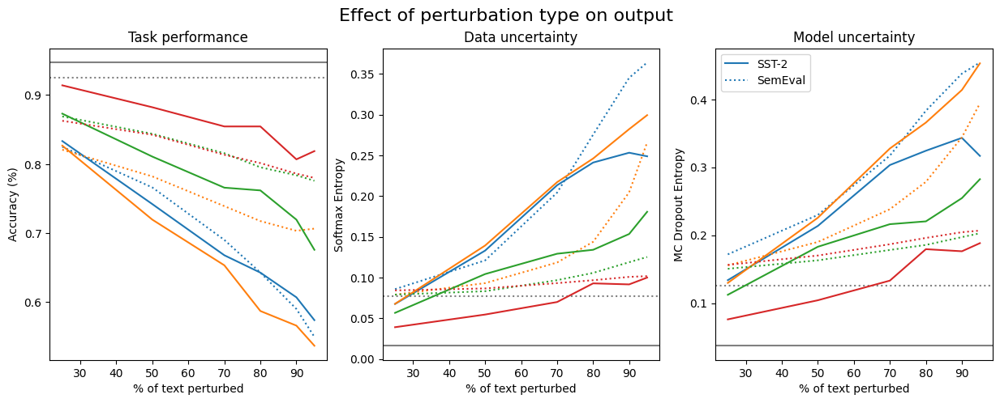

In [22]:
from matplotlib.lines import Line2D

fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation type on output", size= 16)

pVa = df_output.groupby(['perturbation','data','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")

ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SST-2')]['accuracy'].mean(), label = "No perturbation", color='grey', linestyle='-')
ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SemEval')]['accuracy'].mean(), label = "No perturbation", color='grey', linestyle=':')


ax[0].plot(pVa['token-mask']['SST-2'], label = "token-mask", color='C0', linestyle='-')
ax[0].plot(pVa['token-mask']['SemEval'], label = "token-mask", color='C0', linestyle=':')


ax[0].plot(pVa['token-unk']['SST-2'], label = "token-unk", color='C1', linestyle='-')
ax[0].plot(pVa['token-unk']['SemEval'], label = "token-unk", color='C1', linestyle=':')

ax[0].plot(pVa['charswap']['SST-2'], label = "charswap", color='C2', linestyle='-')
ax[0].plot(pVa['charswap']['SemEval'], label = "charswap", color='C2', linestyle=':')

ax[0].plot(pVa['synonym']['SST-2'], label = "synonym", color='C3', linestyle='-')
ax[0].plot(pVa['synonym']['SemEval'], label = "synonym", color='C3', linestyle=':')

# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['perturbation','data','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")


ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SST-2')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle='-')
ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SemEval')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')


ax[1].plot(pVc1['token-mask']['SST-2'], label = "token-mask", color='C0', linestyle='-')
ax[1].plot(pVc1['token-mask']['SemEval'], label = "token-mask", color='C0', linestyle=':')


ax[1].plot(pVc1['token-unk']['SST-2'], label = "token-unk", color='C1', linestyle='-')
ax[1].plot(pVc1['token-unk']['SemEval'], label = "token-unk", color='C1', linestyle=':')

ax[1].plot(pVc1['charswap']['SST-2'], label = "charswap", color='C2', linestyle='-')
ax[1].plot(pVc1['charswap']['SemEval'], label = "charswap", color='C2', linestyle=':')

ax[1].plot(pVc1['synonym']['SST-2'], label = "synonym", color='C3', linestyle='-')
ax[1].plot(pVc1['synonym']['SemEval'], label = "synonym", color='C3', linestyle=':')

# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['perturbation','data','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")

ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SST-2')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle='-')
ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['data'] == 'SemEval')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')


ax[2].plot(pVc2['token-mask']['SST-2'], label = "token-mask", color='C0', linestyle='-')
ax[2].plot(pVc2['token-mask']['SemEval'], label = "token-mask", color='C0', linestyle=':')


ax[2].plot(pVc2['token-unk']['SST-2'], label = "token-unk", color='C1', linestyle='-')
ax[2].plot(pVc2['token-unk']['SemEval'], label = "token-unk", color='C1', linestyle=':')

ax[2].plot(pVc2['charswap']['SST-2'], label = "charswap", color='C2', linestyle='-')
ax[2].plot(pVc2['charswap']['SemEval'], label = "charswap", color='C2', linestyle=':')

ax[2].plot(pVc2['synonym']['SST-2'], label = "synonym", color='C3', linestyle='-')
ax[2].plot(pVc2['synonym']['SemEval'], label = "synonym", color='C3', linestyle=':')


ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='SST-2'),
              Line2D([0], [0], linestyle=':', label='SemEval')])

ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")

plt.savefig("Figures/TypevsOutput_DATA.png")
#plt.show()

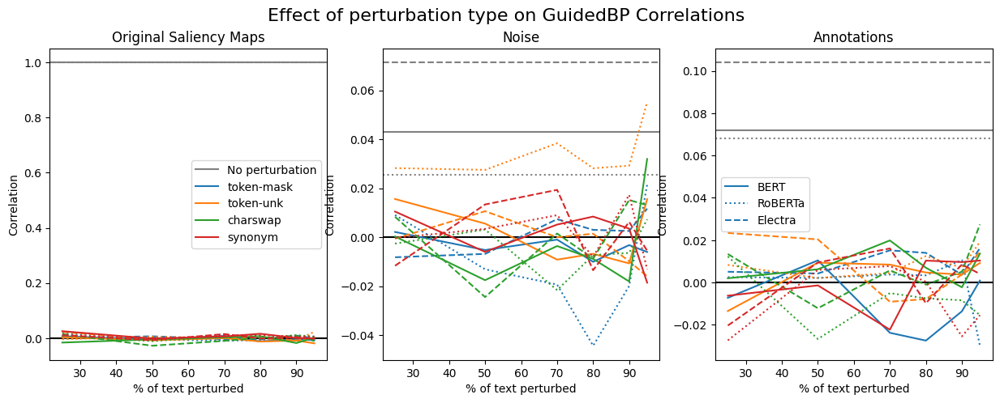

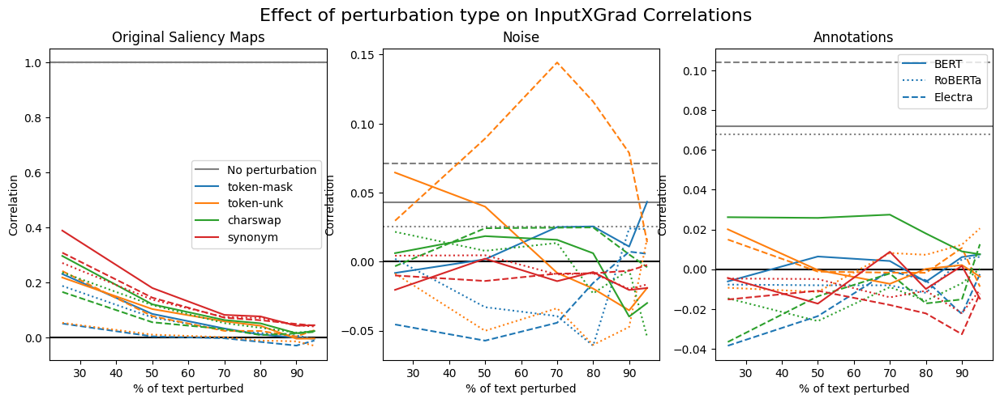

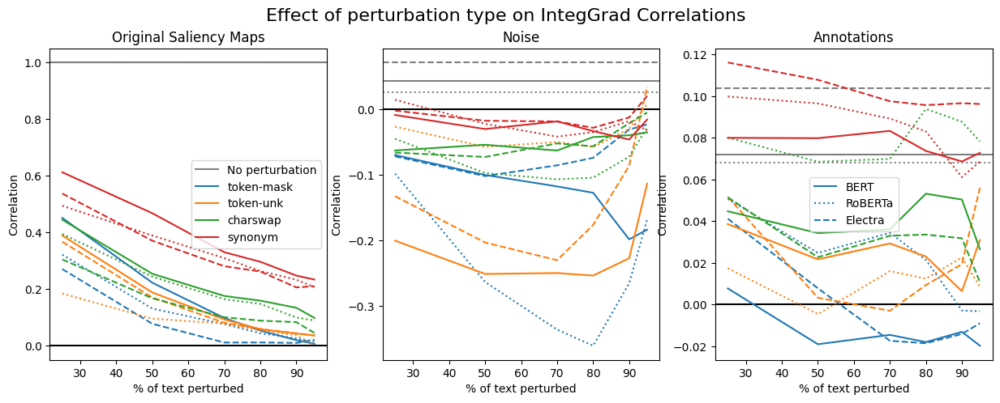

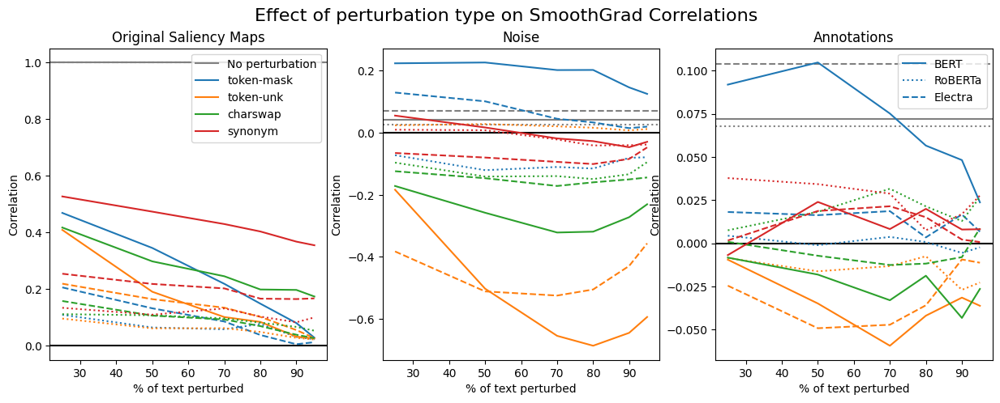

In [25]:
from matplotlib.lines import Line2D

for k in grads:
    fig, ax = plt.subplots(1,3, figsize=(15, 5))
    fig.suptitle(f"Effect of perturbation type on {k} Correlations", size= 16)

    pVa = df_output.groupby(['perturbation','model','lvl'])[f'{k}_og_corr'].mean()


    ax[0].set_title("Original Saliency Maps")

    ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'bert')][f'{k}_og_corr'].mean(), label = "No perturbation", color='grey', linestyle='-')
    ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'roberta')][f'{k}_og_corr'].mean(), color='grey', linestyle=':')
    ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'electra')][f'{k}_og_corr'].mean(), color='grey', linestyle='--')
    ax[0].axhline(0,color='black')

    ax[0].plot(pVa['token-mask']['bert'], label = "token-mask", color='C0', linestyle='-')
    ax[0].plot(pVa['token-mask']['roberta'], color='C0', linestyle=':')
    ax[0].plot(pVa['token-mask']['electra'], color='C0', linestyle='--')


    ax[0].plot(pVa['token-unk']['bert'], label = "token-unk", color='C1', linestyle='-')
    ax[0].plot(pVa['token-unk']['roberta'], color='C1', linestyle=':')
    ax[0].plot(pVa['token-unk']['electra'], color='C1', linestyle='--')

    ax[0].plot(pVa['charswap']['bert'], label = "charswap", color='C2', linestyle='-')
    ax[0].plot(pVa['charswap']['roberta'],color='C2', linestyle=':')
    ax[0].plot(pVa['charswap']['electra'],color='C2', linestyle='--')

    ax[0].plot(pVa['synonym']['bert'], label = "synonym", color='C3', linestyle='-')
    ax[0].plot(pVa['synonym']['roberta'], color='C3', linestyle=':')
    ax[0].plot(pVa['synonym']['electra'], color='C3', linestyle='--')

    ax[0].legend()
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Correlation")

    pVc1 = df_output.groupby(['perturbation','model','lvl'])[f'{k}_noise_corr'].mean()

    ax[1].set_title("Noise")


    ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'bert')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle='-')
    ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'roberta')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'electra')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle='--')
    ax[1].axhline(0, color='black')

    ax[1].plot(pVc1['token-mask']['bert'], label = "token-mask", color='C0', linestyle='-')
    ax[1].plot(pVc1['token-mask']['roberta'], label = "token-mask", color='C0', linestyle=':')
    ax[1].plot(pVc1['token-mask']['electra'], label = "token-mask", color='C0', linestyle='--')


    ax[1].plot(pVc1['token-unk']['bert'], label = "token-unk", color='C1', linestyle='-')
    ax[1].plot(pVc1['token-unk']['roberta'], label = "token-unk", color='C1', linestyle=':')
    ax[1].plot(pVc1['token-unk']['electra'], label = "token-unk", color='C1', linestyle='--')

    ax[1].plot(pVc1['charswap']['bert'], label = "charswap", color='C2', linestyle='-')
    ax[1].plot(pVc1['charswap']['roberta'], label = "charswap", color='C2', linestyle=':')
    ax[1].plot(pVc1['charswap']['electra'], label = "charswap", color='C2', linestyle='--')

    ax[1].plot(pVc1['synonym']['bert'], label = "synonym", color='C3', linestyle='-')
    ax[1].plot(pVc1['synonym']['roberta'], label = "synonym", color='C3', linestyle=':')
    ax[1].plot(pVc1['synonym']['electra'], label = "synonym", color='C3', linestyle='--')

    # ax[1].legend()
    ax[1].set_xlabel("% of text perturbed")
    ax[1].set_ylabel("Correlation")

    pVc2 = df_output.groupby(['perturbation','model','lvl'])[f'{k}_anno_corr'].mean()


    ax[2].set_title("Annotations")

    ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'bert')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle='-')
    ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'roberta')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'electra')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle='--')
    ax[2].axhline(0, color='black')

    ax[2].plot(pVc2['token-mask']['bert'], label = "token-mask", color='C0', linestyle='-')
    ax[2].plot(pVc2['token-mask']['roberta'], label = "token-mask", color='C0', linestyle=':')
    ax[2].plot(pVc2['token-mask']['electra'], label = "token-mask", color='C0', linestyle='--')


    ax[2].plot(pVc2['token-unk']['bert'], label = "token-unk", color='C1', linestyle='-')
    ax[2].plot(pVc2['token-unk']['roberta'], label = "token-unk", color='C1', linestyle=':')
    ax[2].plot(pVc2['token-unk']['electra'], label = "token-unk", color='C1', linestyle='--')

    ax[2].plot(pVc2['charswap']['bert'], label = "charswap", color='C2', linestyle='-')
    ax[2].plot(pVc2['charswap']['roberta'], label = "charswap", color='C2', linestyle=':')
    ax[2].plot(pVc2['charswap']['electra'], label = "charswap", color='C2', linestyle='--')

    ax[2].plot(pVc2['synonym']['bert'], label = "synonym", color='C3', linestyle='-')
    ax[2].plot(pVc2['synonym']['roberta'], label = "synonym", color='C3', linestyle=':')
    ax[2].plot(pVc2['synonym']['electra'], label = "synonym", color='C3', linestyle='--')


    ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='BERT'),
                Line2D([0], [0], linestyle=':', label='RoBERTa'),
                Line2D([0], [0], linestyle='--', label='Electra')])

    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("Correlation")

    plt.savefig(f"Figures/TypevsCorr-{k}_MODELS.png")
    # plt.show()

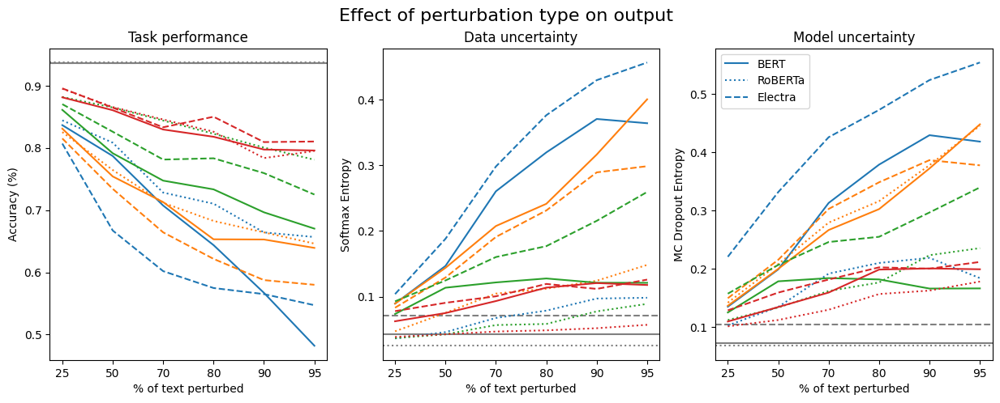

In [151]:
from matplotlib.lines import Line2D

fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation type on output", size= 16)

pVa = df_output.groupby(['perturbation','model','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")

ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'bert')]['accuracy'].mean(), label = "No perturbation", color='grey', linestyle='-')
ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'roberta')]['accuracy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[0].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'electra')]['accuracy'].mean(), label = "No perturbation", color='grey', linestyle='--')


ax[0].plot(pVa['token-mask']['bert'], label = "token-mask", color='C0', linestyle='-')
ax[0].plot(pVa['token-mask']['roberta'], label = "token-mask", color='C0', linestyle=':')
ax[0].plot(pVa['token-mask']['electra'], label = "token-mask", color='C0', linestyle='--')


ax[0].plot(pVa['token-unk']['bert'], label = "token-unk", color='C1', linestyle='-')
ax[0].plot(pVa['token-unk']['roberta'], label = "token-unk", color='C1', linestyle=':')
ax[0].plot(pVa['token-unk']['electra'], label = "token-unk", color='C1', linestyle='--')

ax[0].plot(pVa['charswap']['bert'], label = "charswap", color='C2', linestyle='-')
ax[0].plot(pVa['charswap']['roberta'], label = "charswap", color='C2', linestyle=':')
ax[0].plot(pVa['charswap']['electra'], label = "charswap", color='C2', linestyle='--')

ax[0].plot(pVa['synonym']['bert'], label = "synonym", color='C3', linestyle='-')
ax[0].plot(pVa['synonym']['roberta'], label = "synonym", color='C3', linestyle=':')
ax[0].plot(pVa['synonym']['electra'], label = "synonym", color='C3', linestyle='--')

# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['perturbation','model','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")


ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'bert')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle='-')
ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'roberta')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[1].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'electra')]['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle='--')


ax[1].plot(pVc1['token-mask']['bert'], label = "token-mask", color='C0', linestyle='-')
ax[1].plot(pVc1['token-mask']['roberta'], label = "token-mask", color='C0', linestyle=':')
ax[1].plot(pVc1['token-mask']['electra'], label = "token-mask", color='C0', linestyle='--')


ax[1].plot(pVc1['token-unk']['bert'], label = "token-unk", color='C1', linestyle='-')
ax[1].plot(pVc1['token-unk']['roberta'], label = "token-unk", color='C1', linestyle=':')
ax[1].plot(pVc1['token-unk']['electra'], label = "token-unk", color='C1', linestyle='--')

ax[1].plot(pVc1['charswap']['bert'], label = "charswap", color='C2', linestyle='-')
ax[1].plot(pVc1['charswap']['roberta'], label = "charswap", color='C2', linestyle=':')
ax[1].plot(pVc1['charswap']['electra'], label = "charswap", color='C2', linestyle='--')

ax[1].plot(pVc1['synonym']['bert'], label = "synonym", color='C3', linestyle='-')
ax[1].plot(pVc1['synonym']['roberta'], label = "synonym", color='C3', linestyle=':')
ax[1].plot(pVc1['synonym']['electra'], label = "synonym", color='C3', linestyle='--')

# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['perturbation','model','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")

ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'bert')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle='-')
ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'roberta')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[2].axhline(df_output[(df_output['pattern'] == 'Clean') & (df_output['model'] == 'electra')]['entropy'].mean(), label = "No perturbation", color='grey', linestyle='--')


ax[2].plot(pVc2['token-mask']['bert'], label = "token-mask", color='C0', linestyle='-')
ax[2].plot(pVc2['token-mask']['roberta'], label = "token-mask", color='C0', linestyle=':')
ax[2].plot(pVc2['token-mask']['electra'], label = "token-mask", color='C0', linestyle='--')


ax[2].plot(pVc2['token-unk']['bert'], label = "token-unk", color='C1', linestyle='-')
ax[2].plot(pVc2['token-unk']['roberta'], label = "token-unk", color='C1', linestyle=':')
ax[2].plot(pVc2['token-unk']['electra'], label = "token-unk", color='C1', linestyle='--')

ax[2].plot(pVc2['charswap']['bert'], label = "charswap", color='C2', linestyle='-')
ax[2].plot(pVc2['charswap']['roberta'], label = "charswap", color='C2', linestyle=':')
ax[2].plot(pVc2['charswap']['electra'], label = "charswap", color='C2', linestyle='--')

ax[2].plot(pVc2['synonym']['bert'], label = "synonym", color='C3', linestyle='-')
ax[2].plot(pVc2['synonym']['roberta'], label = "synonym", color='C3', linestyle=':')
ax[2].plot(pVc2['synonym']['electra'], label = "synonym", color='C3', linestyle='--')


ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='BERT'),
              Line2D([0], [0], linestyle=':', label='RoBERTa'),
              Line2D([0], [0], linestyle='--', label='Electra')])

ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")

plt.savefig("Figures/TypevsOutput_MODELS.png")
# plt.show()

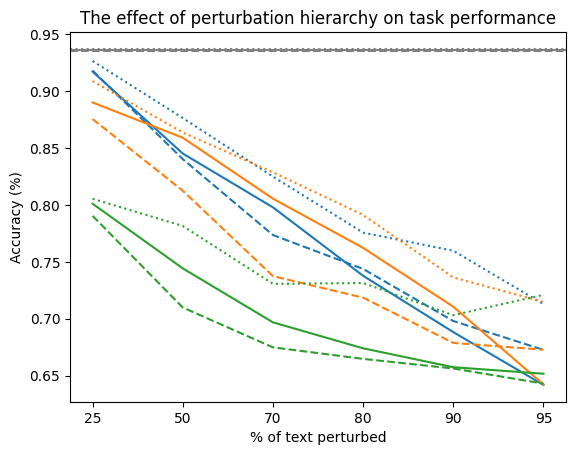

In [142]:
pVa = df_output.groupby(['pattern','model','lvl'])['accuracy'].mean()
pVa

plt.title("The effect of perturbation hierarchy on task performance")

plt.axhline(pVa['Clean']['bert'][0], label = "No perturbation", color='grey', linestyle='-')
plt.axhline(pVa['Clean']['roberta'][0], label = "No perturbation", color='grey', linestyle=':')
plt.axhline(pVa['Clean']['electra'][0], label = "No perturbation", color='grey', linestyle='--')


plt.plot(pVa['random']['bert'], label = "Random", color='C0', linestyle='-')
plt.plot(pVa['random']['roberta'], label = "Random", color='C0', linestyle=':')
plt.plot(pVa['random']['electra'], label = "Random", color='C0', linestyle='--')

plt.plot(pVa['gradient']['bert'], label = "gradient", color='C1', linestyle='-')
plt.plot(pVa['gradient']['roberta'], label = "gradient", color='C1', linestyle=':')
plt.plot(pVa['gradient']['electra'], label = "gradient", color='C1', linestyle='--')

plt.plot(pVa['human']['bert'], label = "human", color='C2', linestyle='-')
plt.plot(pVa['human']['roberta'], label = "human", color='C2', linestyle=':')
plt.plot(pVa['human']['electra'], label = "human", color='C2', linestyle='--')

plt.xlabel("% of text perturbed")
plt.ylabel("Accuracy (%)")


plt.show()

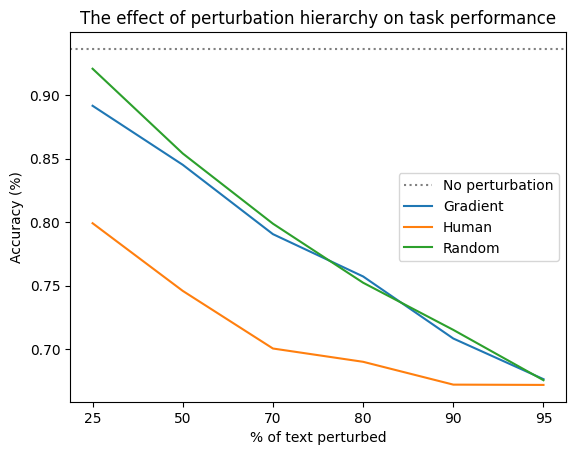

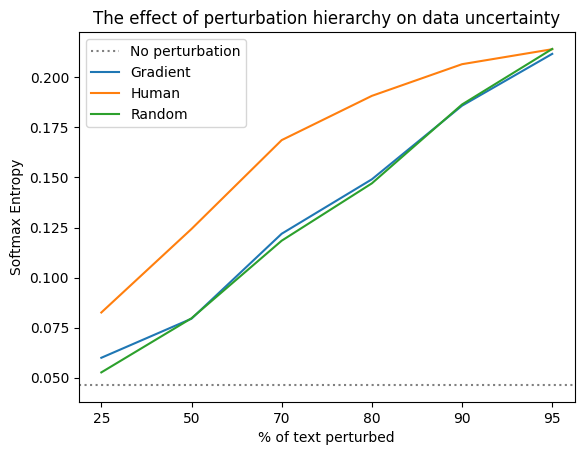

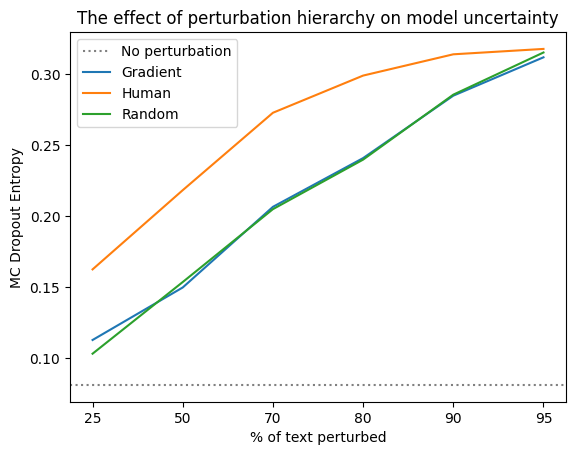

In [98]:

pVa = df_output.groupby(['pattern','lvl'])['accuracy'].mean()


plt.title("The effect of perturbation hierarchy on task performance")
plt.axhline(pVa['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
plt.plot(pVa['gradient'], label = "Gradient")
plt.plot(pVa['human'], label = "Human")
plt.plot(pVa['random'], label = "Random")
plt.legend()
plt.xlabel("% of text perturbed")
plt.ylabel("Accuracy (%)")
plt.show()

pVc1 = df_output.groupby(['pattern','lvl'])['softmax_entropy'].mean()


plt.title("The effect of perturbation hierarchy on data uncertainty")
plt.axhline(pVc1['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
plt.plot(pVc1['gradient'], label = "Gradient")
plt.plot(pVc1['human'], label = "Human")
plt.plot(pVc1['random'], label = "Random")
plt.legend()
plt.xlabel("% of text perturbed")
plt.ylabel("Softmax Entropy")
plt.show()

pVc2 = df_output.groupby(['pattern','lvl'])['entropy'].mean()


plt.title("The effect of perturbation hierarchy on model uncertainty")
plt.axhline(pVc2['Clean'][0], label = "No perturbation", color='grey', linestyle=':')
plt.plot(pVc2['gradient'], label = "Gradient")
plt.plot(pVc2['human'], label = "Human")
plt.plot(pVc2['random'], label = "Random")
plt.legend()
plt.xlabel("% of text perturbed")
plt.ylabel("MC Dropout Entropy")
plt.show()

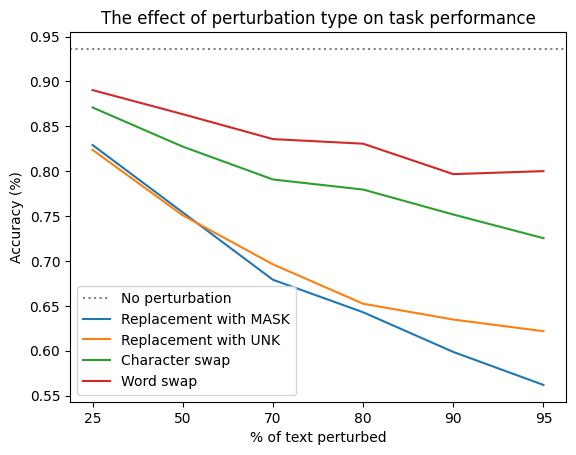

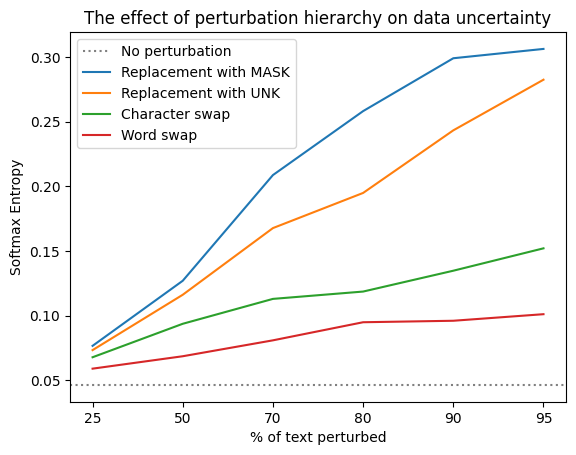

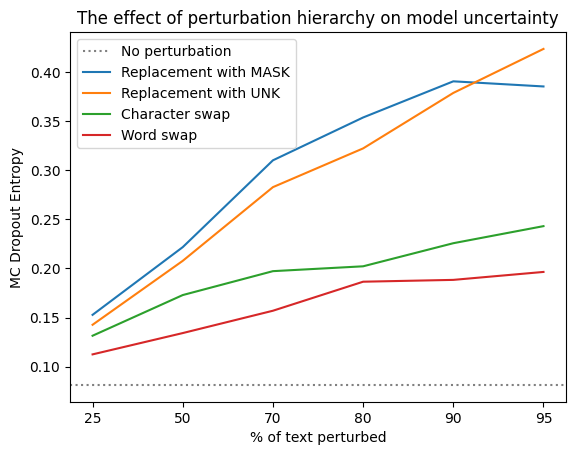

In [106]:
pVa = df_output.groupby(['perturbation','lvl'])['accuracy'].mean()


plt.title("The effect of perturbation type on task performance")
plt.axhline(df_output[df_output['pattern'] == 'Clean']['accuracy'].mean(), label = "No perturbation", color='grey', linestyle=':')
plt.plot(pVa['token-mask'], label = "Replacement with MASK")
plt.plot(pVa['token-unk'], label = "Replacement with UNK")
plt.plot(pVa['charswap'], label = "Character swap")
plt.plot(pVa['synonym'], label = "Word swap")
plt.plot()
plt.legend()
plt.xlabel("% of text perturbed")
plt.ylabel("Accuracy (%)")
plt.show()

pVc1 = df_output.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
plt.title("The effect of perturbation hierarchy on data uncertainty")
plt.axhline(df_output[df_output['pattern'] == 'Clean']['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
plt.plot(pVc1['token-mask'], label = "Replacement with MASK")
plt.plot(pVc1['token-unk'], label = "Replacement with UNK")
plt.plot(pVc1['charswap'], label = "Character swap")
plt.plot(pVc1['synonym'], label = "Word swap")
plt.legend()
plt.xlabel("% of text perturbed")
plt.ylabel("Softmax Entropy")
plt.show()

pVc2 = df_output.groupby(['perturbation','lvl'])['entropy'].mean()

plt.title("The effect of perturbation hierarchy on model uncertainty")
plt.axhline(df_output[df_output['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
plt.plot(pVc2['token-mask'], label = "Replacement with MASK")
plt.plot(pVc2['token-unk'], label = "Replacement with UNK")
plt.plot(pVc2['charswap'], label = "Character swap")
plt.plot(pVc2['synonym'], label = "Word swap")
plt.legend()
plt.xlabel("% of text perturbed")
plt.ylabel("MC Dropout Entropy")
plt.show()

'True False False False True True'

## Uncertainty results

In [3]:
# First clean data

for model in models:
    for dataset in datasets:
                filename = f"Uncertainty/{model}/CLEAN/{dataset}_uncertainty.tsv"
                
                df = pd.read_csv(filename, index_col=0)
                
                certainty_mean = df[['mean_0','mean_1']].max(axis=1).mean()
                entropy = df[['entropy']].max(axis=1).mean()
                mutual_info = df[['mutual_info']].max(axis=1).mean()
                
                COI = 'variance_'+ df[['mean_0','mean_1']].idxmax(axis=1).map(lambda x: x[-1]).values
                variances = []
                for i in range(df.shape[0]):
                    variances.append(df[COI[i]].iloc[i])
                certainty_variance = np.mean(variances)
                
                stats.append(['Clean', None, model, dataset, None, 0, certainty_mean, certainty_variance, entropy, mutual_info])

                #### HOW TO CONSOLIDATE ALL INFORMATION INTO ONE?

In [4]:

PATTERN = 'random'

for model in models:
    for dataset in datasets:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise
                filename = f"Uncertainty/{model}/{PATTERN}/{nk}/{lvl}/{dataset}_uncertainty.tsv"
                
                df = pd.read_csv(filename, index_col=0)
                
                certainty_mean = df[['mean_0','mean_1']].max(axis=1).mean()
                entropy = df[['entropy']].max(axis=1).mean()
                mutual_info = df[['mutual_info']].max(axis=1).mean()
                
                COI = 'variance_'+ df[['mean_0','mean_1']].idxmax(axis=1).map(lambda x: x[-1]).values
                variances = []
                for i in range(df.shape[0]):
                    variances.append(df[COI[i]].iloc[i])
                certainty_variance = np.mean(variances)
                
                stats.append([PATTERN, None, model, dataset, nk, lvl, certainty_mean, certainty_variance, entropy, mutual_info])

                #### HOW TO CONSOLIDATE ALL INFORMATION INTO ONE?

In [5]:
PATTERN = 'gradient'

for model in models:
    for dataset in datasets:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise
                filename = f"Uncertainty/{model}/{PATTERN}/{nk}/{lvl}/{dataset}_uncertainty.tsv"
                
                df = pd.read_csv(filename, index_col=0)
                
                certainty_mean = df[['mean_0','mean_1']].max(axis=1).mean()
                entropy = df[['entropy']].max(axis=1).mean()
                mutual_info = df[['mutual_info']].max(axis=1).mean()
                
                COI = 'variance_'+ df[['mean_0','mean_1']].idxmax(axis=1).map(lambda x: x[-1]).values
                variances = []
                for i in range(df.shape[0]):
                    variances.append(df[COI[i]].iloc[i])
                certainty_variance = np.mean(variances)
                
                stats.append([PATTERN, None, model, dataset, nk, lvl, certainty_mean, certainty_variance, entropy, mutual_info])

                #### HOW TO CONSOLIDATE ALL INFORMATION INTO ONE?

In [7]:
PATTERN = 'human'

for model in models:
    for dataset in datasets:
        for pt in ['S', 'R']:
            for nk in nks: # kinds of noise
                for lvl in lvls: # levels of noise
                    try:
                        filename = f"Uncertainty/{model}/{PATTERN}/{pt}/{nk}/{lvl}/{dataset}_uncertainty.tsv"
                        
                        df = pd.read_csv(filename, index_col=0)
                        
                        certainty_mean = df[['mean_0','mean_1']].max(axis=1).mean()
                        entropy = df[['entropy']].max(axis=1).mean()
                        mutual_info = df[['mutual_info']].max(axis=1).mean()
                        
                        COI = 'variance_'+ df[['mean_0','mean_1']].idxmax(axis=1).map(lambda x: x[-1]).values
                        variances = []
                        for i in range(df.shape[0]):
                            variances.append(df[COI[i]].iloc[i])
                        certainty_variance = np.mean(variances)
                        
                        stats.append([PATTERN, pt, model, dataset, nk, lvl, certainty_mean, certainty_variance, entropy, mutual_info])
                    except FileNotFoundError:
                        stats.append([PATTERN, pt, model, dataset, nk, lvl, np.nan, np.nan, np.nan, np.nan])

In [10]:
PATTERN = 'human'
pt = 'A'

for model in models:
    for dataset in datasets:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise
                try:
                    filename = f"Uncertainty/{model}/{PATTERN}/{pt}/{nk}/{dataset}_uncertainty.tsv"
                    
                    df = pd.read_csv(filename, index_col=0)
                    
                    certainty_mean = df[['mean_0','mean_1']].max(axis=1).mean()
                    entropy = df[['entropy']].max(axis=1).mean()
                    mutual_info = df[['mutual_info']].max(axis=1).mean()
                    
                    COI = 'variance_'+ df[['mean_0','mean_1']].idxmax(axis=1).map(lambda x: x[-1]).values
                    variances = []
                    for i in range(df.shape[0]):
                        variances.append(df[COI[i]].iloc[i])
                    certainty_variance = np.mean(variances)
                    
                    stats.append([PATTERN, pt, model, dataset, nk, None, certainty_mean, certainty_variance, entropy, mutual_info])
                except FileNotFoundError:
                    stats.append([PATTERN, pt, model, dataset, nk, lvl, np.nan, np.nan, np.nan, np.nan])

In [23]:
df_uncertainty = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'])
## Convert to dataframe
## Save for later

df_uncertainty.certainty_mean.iloc[0]

dtype('float64')

In [28]:
df_uncertainty.drop(columns=['pattern_type', 'model', 'data', 'perturbation', 'lvl']).groupby(['pattern']).mean()

,certainty_mean,certainty_variance,entropy,mutual_info
pattern,,,,
Clean,0.971691,0.007721,0.081310,0.022478
gradient,0.908492,0.021958,0.217780,0.061984
human,0.892722,0.024802,0.249426,0.069613
random,0.908566,0.022497,0.217047,0.063406


In [30]:
df_uncertainty.drop(columns=['pattern_type', 'data', 'lvl']).groupby(['pattern', 'model','perturbation']).mean()

certainty_mean  certainty_variance   entropy  \
pattern  model   perturbation                                                 
gradient bert    charswap            0.939372            0.012986  0.154712   
                 synonym             0.939208            0.015990  0.149843   
                 token-mask          0.853799            0.016273  0.294850   
                 token-unk           0.892582            0.012058  0.252792   
         electra charswap            0.908811            0.013999  0.228409   
                 synonym             0.928725            0.017808  0.182985   
                 token-mask          0.826696            0.042528  0.398675   
                 token-unk           0.896088            0.022305  0.258907   
         roberta charswap            0.935073            0.028765  0.158364   
                 synonym             0.943020            0.026699  0.139635   
                 token-mask          0.942794            0.022740  0.145450   
                 token-unk           0.895733            0.031349  0.248734   
human    bert    charswap            0.929151            0.015341  0.177691   
                 synonym             0.931159            0.018272  0.167849   
                 token-mask          0.854798            0.017251  0.303937   
                 token-unk           0.868245            0.014149  0.300487   
         electra charswap            0.901515            0.017482  0.245826   
                 synonym             0.930999            0.017503  0.176971   
                 token-mask          0.808210            0.050100  0.431311   
                 token-unk           0.863651            0.031970  0.318857   
         roberta charswap            0.924130            0.034625  0.177222   
                 synonym             0.947233            0.025119  0.127665   
                 token-mask          0.925178            0.033107  0.186258   
                 token-unk           0.866866            0.045417  0.310734   
random   bert    charswap            0.937110            0.012667  0.161496   
                 synonym             0.932877            0.017611  0.162694   
                 token-mask          0.859742            0.016366  0.287276   
                 token-unk           0.900648            0.011849  0.245770   
         electra charswap            0.908153            0.014753  0.227544   
                 synonym             0.936561            0.015950  0.169745   
                 token-mask          0.822555            0.045554  0.399570   
                 token-unk           0.894158            0.024870  0.257497   
         roberta charswap            0.934242            0.027868  0.154082   
                 synonym             0.945604            0.024575  0.130569   
                 token-mask          0.939225            0.025070  0.151749   
                 token-unk           0.891914            0.032834  0.256568   

                               mutual_info  
pattern  model   perturbation               
gradient bert    charswap         0.037255  
                 synonym          0.045818  
                 token-mask       0.044827  
                 token-unk        0.034723  
         electra charswap         0.038490  
                 synonym          0.049189  
                 token-mask       0.114290  
                 token-unk        0.062045  
         roberta charswap         0.083768  
                 synonym          0.078494  
                 token-mask       0.066922  
                 token-unk        0.087985  
human    bert    charswap         0.043890  
                 synonym          0.052635  
                 token-mask       0.048543  
                 token-unk        0.039901  
         electra charswap         0.048389  
                 synonym          0.048582  
                 token-mask       0.132483  
                 token-unk        0.087390  
         roberta charswap         0.10

In [ ]:
## Visualize
df_uncertainty.

### Testing out

In [4]:
import pandas as pd
df = pd.read_csv("Uncertainty/bert/random/charswap/25/SemEval_uncertainty.tsv", index_col=0)
df.head()

,mean_0,mean_1,variance_0,variance_1,entropy,mutual_info
155285232084467712,0.997398,0.002602,3.505587e-06,3.505575e-06,0.018082,0.000385
158551378271277058,0.998000,0.002000,6.115414e-07,6.115399e-07,0.014425,0.000125
159200989268807680,0.922502,0.077498,4.091377e-02,4.091377e-02,0.272616,0.160616
160323475427430400,0.995091,0.004909,1.790305e-05,1.790306e-05,0.030999,0.001138
160660491574837248,0.018057,0.981943,6.009048e-05,6.009039e-05,0.090376,0.001556


## Saliency results

In [35]:
from scipy.stats import pearsonr
from datasets import load_from_disk
from sklearn.metrics import average_precision_score
from scipy.stats import entropy
import pandas as pd
import numpy as np


def convert_to_list(val):
    return [float(x) for x in val.split(' ')]

grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']

In [3]:
load_from_disk(f"./Data/Patterns/{dataset}")['annotations']

anno_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
label_pattern =  pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"label"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="label").map(lambda x: x*2 - 1)
                        
anno_pattern = anno_pattern * label_pattern

anno_pattern.name = 'anno'

In [6]:
# df[['attribution_scores']].merge(perturb_pattern, left_index=True, right_index=True, how = 'inner').dropna()

NameError: name 'df' is not defined

In [ ]:
# df[df['attribution_scores'].map(len) != df_og['attribution_scores'].map(len)]

# df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').dropna().applymap(len).loc[429]

# from datasets import load_from_disk
# out = load_from_disk(f"./Data/Noise/SST-2")

# for i, idx in enumerate(out['index']):
#     if idx == 429:
#         print(i)
#         break
    
# out[49][f"{PATTERN}-{pt}_{nk}_{lvl}"]

In [13]:
anno_pattern

0      [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
20     [0.0, 0.6667, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0....
26     [-0.0, 0.6667, -0.0, -0.0, -0.0, 0.6667, 0.333...
33     [0.6667, -0.0, -0.0, 0.6667, -0.0, -0.0, 0.666...
71     [-0.0, -0.0, -0.0, 1.0, 1.0, 0.3333, -0.0, 0.3...
                             ...                        
485    [-0.0, -0.0, 0.3333, -0.0, -0.0, -0.0, -0.0, -...
489    [-0.0, 0.3333, -0.0, 0.3333, -0.0, 1.0, 0.3333...
492    [-0.0, -0.0, -0.0, 0.3333, -0.0, 0.3333, -0.0,...
495    [-0.0, -0.0, -0.0, -0.0, -0.0, -0.0, 0.3333, 0...
498    [0.0, 0.6667, 0.3333, 0.3333, 0.6667, 0.0, 0.0...
Name: anno, Length: 63, dtype: object

In [14]:
anno_pattern.map(lambda x: np.where(x>0, 1, 0))

0                [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
20     [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, ...
26     [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, ...
33                        [1, 0, 0, 1, 0, 0, 1, 0, 1, 0]
71         [0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]
                             ...                        
485    [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
489                             [0, 1, 0, 1, 0, 1, 1, 0]
492    [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
495    [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, ...
498    [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Name: anno, Length: 63, dtype: object

In [16]:
df[['attribution_scores']].merge(anno_pattern.map(lambda x: np.where(x>0, 1, 0)), left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: average_precision_score( x.anno, x.attribution_scores), axis=1)

id
0      0.755556
20     0.570421
26     0.695578
33     0.391667
71     0.564021
         ...   
485    0.421102
489    0.600000
492    0.625490
495    0.699206
498    0.258333
Length: 63, dtype: float64

In [34]:
entropy(pk=a)

2.5472644891717433

In [60]:
df['attribution_scores'].loc[0] / np.sum(np.abs(df['attribution_scores'].loc[0]))

array([ 0.27388535,  0.10191083,  0.00636943,  0.07006369,  0.01273885,
       -0.07006369,  0.04458599, -0.01910828, -0.04458599,  0.01273885,
       -0.17197452, -0.08917197, -0.08280255])

In [65]:
entropy([0.5,0.5,-0.5])

-inf

In [63]:
entropy(np.abs(np.array([ 0.27388535,  0.10191083,  0.00636943,  0.07006369,  0.01273885,
       -0.07006369,  0.04458599, -0.01910828, -0.04458599,  0.01273885,
       -0.17197452, -0.08917197, -0.08280255]))

2.1808532669522642

In [62]:
k = "IntegGrad"
filename = f"Saliency/Clean/{model}/{PATTERN}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
df = pd.read_csv(filename, index_col=0, sep = '\t')

df['attribution_scores'] = df['attribution_scores'].map(convert_to_list)
                    
entropy(df['attribution_scores'].loc[0])

-inf

In [66]:
PATTERN = 'random'
pt = 'S'
k = "IntegGrad"

nks = ['token-mask', 'token-unk', 'charswap', 'synonym']
lvls = ['25', '50', '70', '80', '90', '95'] 

stats=[]


def get_entropy_complexity(x):
    a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
    return entropy(pk=a)

for model in ['roberta']:
    for dataset in ['SST-2']:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise

                noise_map = []
                all_anno_map = []
                majo_anno_map = []
                complexities = []
                                
                if PATTERN == 'human':
                    perturb_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"{PATTERN}-{pt}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="perturbation")
                elif PATTERN == 'gradient':
                    perturb_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"{PATTERN}-{model}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="perturbation")
                else: # random
                    perturb_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"{PATTERN}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="perturbation")
                    
                anno_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))

                label_pattern =  pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"label"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="label").map(lambda x: x*2 - 1)
                                        
                anno_pattern *= label_pattern
                all_annos_pattern= anno_pattern.map(lambda x: np.where(x>0, 1, 0))
                majority_annos_pattern= anno_pattern.map(lambda x: np.where(x>0.5, 1, 0))
                
                all_annos_pattern.name = 'anno'
                majority_annos_pattern.name = 'anno'

                
                #### if PATTERN == human, need pt,
                
                for k in grads:
                    
                    filename = f"Saliency/Clean/{model}/{PATTERN}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
                    df = pd.read_csv(filename, index_col=0, sep = '\t')
                    
                    df['attribution_scores'] = df['attribution_scores'].map(convert_to_list)
                    
                    
                    ## Get correlation to perturbation map
                    noise_corrs = df[['attribution_scores']].merge(perturb_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: average_precision_score( x.perturbation, x.attribution_scores), axis=1)
                    noise_map.append(np.mean(noise_corrs))
                    
                    ## Get correlation to humman annotation
                    all_anno_corrs = df[['attribution_scores']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: average_precision_score( x.anno, x.attribution_scores), axis=1)
                    all_anno_map.append(np.mean(all_anno_corrs))
                    
                    majo_anno_corrs = df[['attribution_scores']].merge(majority_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: average_precision_score( x.anno, x.attribution_scores), axis=1)
                    majo_anno_map.append(np.mean(majo_anno_corrs))
                    
                    complexity = df['attribution_scores'].map(get_entropy_complexity)
                    complexities.append(np.mean(complexity))
                    
                    
                stats.append([PATTERN, None, model, dataset, nk, lvl] + noise_map + all_anno_map + majo_anno_map + complexities)

                    #### HOW TO CONSOLIDATE ALL INFORMATION INTO ONE?

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one fo

In [67]:
pd.DataFrame(stats)

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,random,None,roberta,SST-2,token-mask,25,0.351365,0.320315,0.356689,0.368935,...,0.583809,0.476650,0.313620,0.291663,0.525236,0.360748,2.301033,2.296798,2.250496,2.656880
1,random,None,roberta,SST-2,token-mask,50,0.552942,0.561421,0.546865,0.555416,...,0.531535,0.472143,0.319832,0.257849,0.482420,0.361291,2.263319,2.164146,2.292928,2.656409
2,random,None,roberta,SST-2,token-mask,70,0.741434,0.725245,0.702073,0.734064,...,0.502100,0.463899,0.304139,0.285370,0.413524,0.337523,2.152153,2.148914,2.243590,2.673362
3,random,None,roberta,SST-2,token-mask,80,0.815363,0.798366,0.796404,0.806795,...,0.458769,0.447779,0.267034,0.306410,0.369546,0.349219,2.156701,2.142439,2.273737,2.673672
4,random,None,roberta,SST-2,token-mask,90,0.913965,0.904550,0.903286,0.912048,...,0.441451,0.397251,0.268264,0.283090,0.324361,0.274223,2.116842,2.156983,2.253501,2.688544
5,random,None,roberta,SST-2,token-mask,95,0.961535,0.961676,0.965263,0.952077,...,0.454203,0.410721,0.261497,0.265610,0.297049,0.280472,2.113402,2.244762,2.388829,2.687955
6,random,None,roberta,SST-2,token-unk,25,0.345799,0.348980,0.353790,0.339705,...,0.508700,0.436370,0.300992,0.284593,0.412205,0.310527,2.286058,2.270468,2.300283,2.675453
7,random,None,roberta,SST-2,token-unk,50,0.532630,0.503670,0.534229,0.518340,...,0.433280,0.405492,0.253965,0.273142,0.316099,0.267768,2.345614,2.291673,2.308091,2.690687
8,random,None,roberta,SST-2,token-unk,70,0.728655,0.724442,0.716508,0.697144,...,0.411165,0.376903,0.251536,0.284890,0.289207,0.247633,2.362284,2.406028,2.381891,2.696486
9,random,None,roberta,SST-2,token-unk,80,0.811342,0.806963,0.815287,0.796791,...,0.408942,0.358179,0.293797,0.280777,0.285570,0.217828,2.356540,2.445149,2.313982,2.697328


In [162]:
PATTERN = 'random'
pt = 'S'

nks = ['token-mask', 'token-unk', 'charswap', 'synonym']
lvls = ['25', '50', '70', '80', '90', '95'] 

stats=[]

for model in ['roberta']:
    for dataset in ['SST-2']:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise
                og_sims = []
                noise_sims = []
                anno_sims = []
                                
                if PATTERN == 'human':
                    perturb_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"{PATTERN}-{pt}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="perturbation")
                elif PATTERN == 'gradient':
                    perturb_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"{PATTERN}-{model}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="perturbation")
                else: # random
                    perturb_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"{PATTERN}_PATTERN_{lvl}"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="perturbation")
                    
                anno_pattern = pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
                label_pattern =  pd.Series(load_from_disk(f"./Data/Patterns/{dataset}")[f"label"], index=load_from_disk(f"./Data/Patterns/{dataset}")["index"], name="label").map(lambda x: x*2 - 1)
                                        
                anno_pattern *= label_pattern
                anno_pattern.name = 'anno'
                
                #### if PATTERN == human, need pt,
                
                for k in grads:
                    og_filename = f"Saliency/Clean/{model}/{dataset}-{k}.tsv"
                    df_og = pd.read_csv(og_filename, index_col=0, sep = '\t')
                
                    filename = f"Saliency/Clean/{model}/{PATTERN}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
                    df = pd.read_csv(filename, index_col=0, sep = '\t')
                    
                    df['attribution_scores'] = df['attribution_scores'].map(convert_to_list)
                    df_og['attribution_scores'] = df_og['attribution_scores'].map(convert_to_list)
                    
                    accuracy_mean = 1 - (df['true_class'] - df['pred_class']).abs().mean()
                    pred_prob = df['pred_prob'].mean()
                    pred_entropy = df['pred_entropy'].mean()
                    
                    ## Get correlation to original saliency map
                    og_corrs = df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores_x, x.attribution_scores_y, temp_fix=True, extra_data=[nk,lvl]), axis=1)
                    og_sims.append(np.mean(og_corrs))
                    
                    ## Get correlation to perturbation map
                    noise_corrs = df[['attribution_scores']].merge(perturb_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores, x.perturbation, temp_fix=True, extra_data=[nk,lvl]), axis=1)
                    noise_sims.append(np.mean(noise_corrs))
                    
                    ## Get correlation to humman annotation
                    anno_corrs = df[['attribution_scores']].merge(anno_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores, x.anno, temp_fix=True, extra_data=[nk,lvl]), axis=1)
                    anno_sims.append(np.mean(anno_corrs))
                    
                stats.append([PATTERN, None, model, dataset, nk, lvl, accuracy_mean, pred_prob, pred_entropy] + og_sims + noise_sims + anno_sims)

                    #### HOW TO CONSOLIDATE ALL INFORMATION INTO ONE?

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/nois

FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
FIXED:  ['charswap', '70']
F

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']


/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']
FIXED:  ['charswap', '90']


/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']


/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']


/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']
FIXED:  ['charswap', '95']


/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/nois

### Debugging old code

In [5]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from datasets import load_from_disk

stats = []

grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
models = ['bert', 'electra', 'roberta']
datasets = [ 'SemEval', 'SST-2']
nks = ['token-mask', 'token-unk', 'charswap', 'synonym']
lvls = ['25', '50', '70', '80', '90', '95'] 


# First clean
PATTERN = 'Clean'
                             
for model in models:
    for dataset in datasets:
                
                
                certainty_mean = 1
                entropy = 1
                mutual_info = 1
                certainty_variance = 1
                
                og_sims = []
                noise_sims = []
                anno_sims = []
                
                
                for k in grads:
                    
                    accuracy_mean = 1
                    pred_prob = 1
                    pred_entropy = 1
                    
                    og_sims.append(1.0) # Perfect correlation
                    
                    ## Get correlation to perturbation map
                    noise_sims.append(1) ## No perturbation in Clean data
                    
                    anno_sims.append(1)
                    
                stats.append(['Clean', None, model, dataset, None, 0, accuracy_mean, pred_prob, pred_entropy, certainty_mean, certainty_variance, entropy, mutual_info] + og_sims + noise_sims + anno_sims)
                

PATTERN = 'random'

for model in models:
    for dataset in datasets:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise

                
                certainty_mean = 1
                entropy = 1
                mutual_info = 1
                
                certainty_variance = 1
                
                og_sims = []
                noise_sims = []
                anno_sims = []
                                
                                            
                for k in grads:

                    accuracy_mean = 1 
                    pred_prob = 1
                    pred_entropy = 1
                    
                    ## Get correlation to original saliency map
                    og_sims.append(1)
                    
                    ## Get correlation to perturbation map
                    noise_sims.append(1)
                    
                    ## Get correlation to humman annotation
                    anno_sims.append(1)
                    
                stats.append([PATTERN, None, model, dataset, nk, lvl,  accuracy_mean, pred_prob, pred_entropy, certainty_mean, certainty_variance, entropy, mutual_info] + og_sims + noise_sims + anno_sims)
                
PATTERN = 'gradient'

for model in models:
    for dataset in datasets:
        for nk in nks: # kinds of noise
            for lvl in lvls: # levels of noise
                certainty_mean = 1
                entropy = 1
                mutual_info = 1

                certainty_variance = 1

                og_sims = []
                noise_sims = []
                anno_sims = []
                
                for k in grads:
                
                    
                    accuracy_mean = 1 
                    pred_prob = 1
                    pred_entropy = 1
                    
                    ## Get correlation to original saliency map
                    og_sims.append(1)
                    
                    ## Get correlation to perturbation map
                    noise_sims.append(1)
                    
                    ## Get correlation to humman annotation
                    anno_sims.append(1)
                    
                stats.append([PATTERN, None, model, dataset, nk, lvl,  accuracy_mean, pred_prob, pred_entropy, certainty_mean, certainty_variance, entropy, mutual_info] + og_sims + noise_sims + anno_sims)

PATTERN = 'human'

for model in models:
    for dataset in datasets:
        for pt in ['S', 'R']:
            for nk in nks: # kinds of noise
                for lvl in lvls: # levels of noise
                
                
                    certainty_mean = 1
                    entropy = 1
                    mutual_info = 1
                    
                    certainty_variance = 1
                    
                    og_sims = []
                    noise_sims = []
                    anno_sims = []
                        
                    
                    for k in grads:
                        
                        accuracy_mean = 1 
                        pred_prob =1
                        pred_entropy = 1
                        
                        ## Get correlation to original saliency map
                        og_sims.append(1)
                        
                        ## Get correlation to perturbation map
                        noise_sims.append(1)
                        
                        ## Get correlation to humman annotation
                        anno_sims.append(1)
                        
                    stats.append([PATTERN, pt, model, dataset, nk, lvl,  accuracy_mean, pred_prob, pred_entropy, certainty_mean, certainty_variance, entropy, mutual_info] + og_sims + noise_sims + anno_sims)
                    
                        
PATTERN = 'human'
pt = 'A'

for model in models:
    for dataset in datasets:
        for nk in nks: # kinds of noise
            
            certainty_mean = 1
            entropy = 1
            mutual_info = 1
            certainty_variance = 1
            og_sims = []
            noise_sims = []
            anno_sims = []
            
            for k in grads:
                
                accuracy_mean = 1
                pred_prob = 1
                pred_entropy = 1
                
                ## Get correlation to original saliency map
                og_sims.append(1)
                
                ## Get correlation to perturbation map
                noise_sims.append(1)
                
                ## Get correlation to humman annotation
                anno_sims.append(1)
                
            stats.append([PATTERN, pt, model, dataset, nk, None,  accuracy_mean, pred_prob, pred_entropy, certainty_mean, certainty_variance, entropy, mutual_info] + og_sims + noise_sims + anno_sims)
            
                
df_output = pd.DataFrame(stats, columns= ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'] + [k+"_og_corr" for k in grads] + [k+"_noise_corr" for k in grads] + [k+"_anno_corr" for k in grads])


In [53]:
import pandas as pd
df = pd.read_csv("Saliency/Clean/bert/random/charswap/25/SemEval/GuidedBP/GuidedBP.tsv", index_col=0, sep = '\t')
df_og = pd.read_csv("Saliency/Clean/bert/SemEval-GuidedBP.tsv", index_col=0, sep = '\t')


accuracy_mean = 1 + (df['true_class'] - df['pred_class']).mean()
pred_prob = df['pred_prob'].mean()
pred_entropy = df['pred_entropy'].mean()
corrs = df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores_x, x.attribution_scores_y), axis=1)
sim = np.mean(corrs)

df.head()



ValueError: x and y must have the same length.

In [54]:
df_og

,pred_class,true_class,pred_prob,pred_entropy,raw_input,attribution_scores
id,,,,,,
155285232084467712,0,0,1.00,0.012701,I just hope Ian Bennett is first out of the se...,0.26 0.05 -0.05 -0.23 -0.09 0.09 0.29 0.19 -0....
158551378271277058,0,0,1.00,0.015283,Watched a movie yesterday #The70's on #OVTV an...,0.02 -0.06 0.33 0.38 -0.02 0.02 0.04 0.02 0.00...
159200989268807680,0,0,1.00,0.008743,I liked a @YouTube video http://t.co/dSPcjWDB ...,-0.10 -0.63 0.31 0.01 -0.24 -0.00 0.03 0.15 0....
160323475427430400,0,0,0.73,0.584572,A win for #LFC v Bolton will see them beat the...,0.06 0.29 -0.07 0.03 -0.10 -0.14 0.11 0.06 0.0...
162895027431948289,0,0,1.00,0.005845,@couriermail I may not agree with Wilkie's ide...,0.01 0.01 0.01 0.01 0.01 0.01 0.00 -0.00 -0.00...
...,...,...,...,...,...,...
264248465440272384,1,1,0.99,0.045548,Tony Parker may have hit the game winning shot...,-0.02 -0.02 -0.02 -0.03 -0.03 -0.03 -0.03 -0.0...
264252575879151616,1,0,0.95,0.197404,Impressed with Siri. Asked to set an alarm for...,0.01 0.01 0.02 0.02 0.03 0.01 0.01 0.01 0.01 0...
264257216004120576,1,1,0.99,0.039263,The Spurs may be my favorite team out of the w...,-0.04 -0.04 -0.04 -0.04 -0.04 -0.04 -0.04 -0.0...


In [17]:
from scipy.stats import pearsonr

def get_correlation(new, old):
    new = [float(x) for x in new.split(' ')]
    old = [float(x) for x in old.split(' ')]
    return pearsonr(new, old)[0]

# get_correlation('0.1 0.3 0.4', '0.6 0.8 0.9')[0]



# def get_correlation(df):
#     new = [float(x) for x in df['attribution_scores_x'].split(' ')]
#     old = [float(x) for x in df['attribution_scores_y'].split(' ')]
#     return pearsonr(new, old)


# x['attribution_scores_x'], x['attribution_scores_y']

# get_correlation(df['attribution_scores'].iloc[0], df_og['attribution_scores'].iloc[0])

In [22]:
corrs = df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').dropna().apply(lambda x: get_correlation(x.attribution_scores_x, x.attribution_scores_y), axis=1)
np.mean(corrs)

0.00599192401624323

In [23]:
corrs

id
155285232084467712    0.466631
158551378271277058    0.477579
159200989268807680   -0.167485
160323475427430400    0.311336
162895027431948289   -0.357052
                        ...   
264248465440272384   -0.057282
264252575879151616    0.397926
264257216004120576    0.178096
264258491529719808    0.163934
264264907137097728   -0.358219
Length: 1622, dtype: float64

In [72]:
df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id', how = 'inner').isna()

,attribution_scores_x,attribution_scores_y
id,,
155285232084467712,False,False
158551378271277058,False,False
159200989268807680,False,False
160323475427430400,False,False
162895027431948289,False,False
...,...,...
264248465440272384,False,False
264252575879151616,False,False
264257216004120576,False,False


In [76]:
test = df[['attribution_scores']].merge(df_og[['attribution_scores']], on ='id')
r, _ = np.where(test.isna())
r

array([  62,  198,  263,  340,  389,  444,  463,  610,  738,  753,  791,
        795,  897,  943, 1036, 1457])

In [90]:
df_og['attribution_scores']

id
155285232084467712    0.26 0.05 -0.05 -0.23 -0.09 0.09 0.29 0.19 -0....
158551378271277058    0.02 -0.06 0.33 0.38 -0.02 0.02 0.04 0.02 0.00...
159200989268807680    -0.10 -0.63 0.31 0.01 -0.24 -0.00 0.03 0.15 0....
160323475427430400    0.06 0.29 -0.07 0.03 -0.10 -0.14 0.11 0.06 0.0...
162895027431948289    0.03 0.15 -0.04 -0.05 -0.10 0.08 -0.07 0.00 0....
                                            ...                        
264248465440272384    0.11 0.07 0.18 -0.03 0.16 -0.04 0.02 0.05 0.10...
264252575879151616    -0.18 -0.41 0.14 -0.18 0.45 0.14 0.01 -0.01 0....
264257216004120576    -0.01 -0.00 -0.02 0.01 -0.18 -0.01 -0.06 0.05 ...
264258491529719808    -0.09 0.22 0.02 0.06 0.03 0.03 -0.03 -0.13 -0....
264264907137097728    0.11 -0.02 0.04 -0.00 0.09 0.10 0.50 0.07 -0.0...
Name: attribution_scores, Length: 1648, dtype: object

In [79]:
test.iloc[r]

,attribution_scores_x,attribution_scores_y
id,,
181181802910715904,-0.13 -0.09 0.01 0.01 0.05 -0.05 -0.00 0.08 -0...,NaN
216310564090159104,-0.23 0.05 0.10 -0.06 0.12 -0.07 -0.05 -0.56 0...,NaN
225943424677855232,-0.03 0.05 -0.07 -0.05 0.20 -0.39 -0.07 0.16 0...,NaN
233840249099407360,0.07 -0.03 -0.02 0.35 -0.25 0.10 0.43 0.00 0.0...,NaN
239634570142707713,0.02 0.15 0.10 0.17 -0.01 0.02 0.06 -0.03 -0.0...,NaN
244736544735375360,0.02 -0.09 -0.13 0.07 -0.07 0.02 -0.07 0.08 0....,NaN
246248842054488065,-0.01 0.03 0.00 0.04 0.03 0.01 -0.10 -0.01 -0....,NaN
253205217473085440,0.07 0.00 -0.08 0.21 0.06 0.16 -0.17 -0.00 -0....,NaN
256305276205035521,-0.02 0.23 -0.06 -0.03 0.14 0.32 0.61 -0.03 0....,NaN


In [38]:
df_og = pd.read_csv("Saliency/Clean/bert/SemEval-GuidedBP.tsv", index_col=0, sep = '\t')
df_og.head()

,pred_class,true_class,pred_prob,pred_entropy,raw_input,attribution_scores
id,,,,,,
155285232084467712,0,0,1.00,0.012700511,I just hope Ian Bennett is first out of the se...,0.26 0.05 -0.05 -0.23 -0.09 0.09 0.29 0.19 -0....
158551378271277058,0,0,1.00,0.015282822,Watched a movie yesterday #The70's on #OVTV an...,0.02 -0.06 0.33 0.38 -0.02 0.02 0.04 0.02 0.00...
159200989268807680,0,0,1.00,0.008743251,I liked a @YouTube video http://t.co/dSPcjWDB ...,-0.10 -0.63 0.31 0.01 -0.24 -0.00 0.03 0.15 0....
160323475427430400,0,0,0.73,0.5845718,A win for #LFC v Bolton will see them beat the...,0.06 0.29 -0.07 0.03 -0.10 -0.14 0.11 0.06 0.0...
162895027431948289,0,0,1.00,0.005845424,@DiscoMundial thanks! Drop an email to info@ka...,0.03 0.15 -0.04 -0.05 -0.10 0.08 -0.07 0.00 0....


In [36]:
df['pred_prob'].mean()

0.9783725135623871

In [4]:
g = { 'TOKEN': tokenizer.unk_token }
test_dataset = load_from_disk(f"./Data/Noise/{test_data}") #.format(**g)

[k for k in test_dataset.features.keys() if 'token' in k]

for k in test_dataset.features.keys():
    if 'token' in k:
        test_dataset[k] = list(map(lambda x: x.format(**g),test_dataset[k]))


TypeError: 'Dataset' object does not support item assignment